
# Práctica 1: Metaheurísticas basadas en trayectorias: Temple Simulado

<center><h3>
    Eloi Corral López
</h3></center>


## Instrucciones

Esto es **Jupyter Notebook**, un documento que integra código Python en un archivo Markdown.
Esto nos permite ir ejecutando celdas de código poco a poco, así como generar un informe bien formateado de la práctica.

Puedes añadir una celda con el botón **"Insert"** de la barra de herramentas, y cambiar su tipo con **"Cell > Cell Type"**

Para ejecutar una celda de código, la seleccionaremos y pulsaremos el botón **"▶ Run"** de la barra de herramentas.
Para pasar el documento a HTML, seleccionaremos **"File > Download as > HTML (.html)"**

Sigue este guion hasta el final. Ejecuta el código proporcionado paso a paso comprendiendo lo que estás haciendo y reflexionando sobre los resultados. Habrá preguntas intercaladas a lo largo del guion. Responde a todas ellas en la sección reservada para ese fin: **"Respuestas a los ejercicios"**. Por favor, no modifiques ninguna línea de código excepto cuando se te pida explícitamente.

No olvides insertar tu **nombre y apellidos** en la celda superior.

## Entrega de la práctica

La fecha límite de entrega será la indicada en el Campus Virtual. La entrega consistirá de un único archivo comprimido con nombre `APELIDOS_NOME_TempleSimulado.zip` que contenga los siguientes ficheros:

 * `APELIDOS_NOME_TempleSimulado.html`: Archivo HTML fruto de la exportación del presente Notebook, con las preguntas respondidas al final del documento.
 * `APELIDOS_NOME_TempleSimulado.ipynb`: Archivo fuente Jupyter Notebook.
 * Archivo de datos de los problemas utilizados en la resolución.


## Preliminares adicionales sobre Python para esta práctica


Conviene familiarizarse con algunas funciones disponibles en Python que pueden resultarte especialmente útiles más adelante en la realización de esta práctica.


Por ejemplo, puedes generar números aleatorios de la siguiente forma utilizando el paquete `random`.

In [4]:
import random

# podemos crear un numero aleatorio entre 1 y 10
numero_aleatorio = random.randint(1, 2)
print(numero_aleatorio)

# y números aleatorios entre 0 y 1 siguiendo también una distribución uniforme
numero_U = random.uniform(0,1)
print (numero_U)


2
0.7700354470680519


Puedes generar vectores de números fijos y aleatorios que a su vez estén barajados de manera aleatoria como se ilustra a continuación.

In [5]:
vector = [x for x in range (1,10)]
print ("vector fijo ", vector)

random.shuffle(vector)
print (vector)

vector_aleatorio = [ random.randint(1, 10) for i in range(1,10) ]
print ("vector aleatorio ", vector_aleatorio)

random.shuffle(vector_aleatorio)
print (vector_aleatorio)


vector fijo  [1, 2, 3, 4, 5, 6, 7, 8, 9]
[8, 9, 6, 1, 5, 2, 4, 3, 7]
vector aleatorio  [4, 8, 10, 7, 2, 3, 3, 3, 3]
[2, 3, 10, 3, 3, 7, 8, 4, 3]


Puedes incluso fijar la semilla para generar números aleatorios si quisieras que la aleatorización fuera determinista (i.e., secuencias de números aletorios que pueden ser reproducibles). Fíjate en el siguiente ejemplo que muestra como esta determina la secuencia de número si se establece una semilla y por tanto su repitibilidad. Esto puede ser útil si queremos asegurar que dos ejecuciones den el mismo resultado.

In [9]:
import time
# este vector será aleatorio si no habíamos establecido una semilla previamente.
# Podríamos tener incluso una semilla basada en el tiempo actual para forzar que se aleatorice 
# si ejecutamos esta celda múltiples veces
random.seed(time.time())

vector_aleatorio = [ random.randint(1, 10) for i in range(1,10) ]
print ("vector aleatorio ", vector_aleatorio)

# aquí establecemos una semilla totalmente fija
# que no depende del tiempo y por tanto está bajo nuestro control
semilla = 123456
random.seed (semilla)

# este viene determinado por la semilla
vector_aleatorio = [ random.randint(1, 10) for i in range(1,10) ]
print ("vector aleatorio ", vector_aleatorio)

# y ahora somos capaces de generar la misma serie "aleatoria"
random.seed (semilla)
vector_aleatorio = [ random.randint(1, 10) for i in range(1,10) ]
print ("vector aleatorio igual que el anterior", vector_aleatorio)



vector aleatorio  [8, 6, 1, 4, 10, 7, 9, 1, 7]
vector aleatorio  [5, 1, 3, 1, 2, 1, 5, 1, 2]
vector aleatorio igual que el anterior [5, 1, 3, 1, 2, 1, 5, 1, 2]


Un último ejemplo del uso de la semilla sería establecerla justo antes de invocar a una función que queremos hacer la aleatorización totalmente determinista por cuestiones reproducibilidad. Puedes averiguar más en: https://docs.python.org/3/library/random.html

In [10]:

def mi_funcion_pseudo_aleatoria (semilla=None):
    # también podemos recibir la semilla y establecerla en la primera línea
    if (semilla is not None):
        random.seed(semilla)
        
    mi_vector_aleatorio = [ random.randint(1, 10) for i in range(1,10) ]
    return mi_vector_aleatorio
    

random.seed(12345)
vector_aleatorio = mi_funcion_pseudo_aleatoria()
print ("vector aleatorio ", vector_aleatorio)

random.seed(54321)
vector_aleatorio = mi_funcion_pseudo_aleatoria()
print ("vector aleatorio ", vector_aleatorio)

random.seed(12345)
vector_aleatorio = mi_funcion_pseudo_aleatoria()
print ("vector aleatorio ", vector_aleatorio)


vector_aleatorio = mi_funcion_pseudo_aleatoria(12345)
print ("vector aleatorio ", vector_aleatorio)



vector aleatorio  [7, 1, 5, 6, 4, 5, 10, 7, 3]
vector aleatorio  [8, 2, 4, 3, 9, 9, 7, 3, 6]
vector aleatorio  [7, 1, 5, 6, 4, 5, 10, 7, 3]
vector aleatorio  [7, 1, 5, 6, 4, 5, 10, 7, 3]


Otro conjunto de funciones importantes son las que vienen del módulo `math`. Puedes encontrar una lista de las funciones disponibles en https://docs.python.org/3/library/math.html. Ponemos a continuación algunos ejemplos de uso.

In [11]:
import math 

# número e elevado a la potencia indicada
e=math.exp(1)
print (e)

power2_e=math.exp(2)
print (power2_e)

# ejemplo de potencia
print(math.pow(e, 1))
print(math.pow(e, 2))

# ejemplo del logaritmo natural de base e
base = e
print (math.log(e))
print (math.log(e, base))


2.718281828459045
7.38905609893065
2.718281828459045
7.3890560989306495
1.0
1.0


Finalmente, las funciones del módulo `time` te permiten obtener de manera aproximada tiempos de ejecución de secciones concretas de código. 

In [12]:
import time
start_time = time.time()

sum = 0
for i in range(1000000):
    sum = sum * 1

print("---- %s segundos ----" % (time.time() - start_time))

---- 0.22426080703735352 segundos ----


## El Problema del Viajante de Comercio (VC) con Temple Simulado

El objetivo de esta práctica es modelar e implementar un agente inteligente que sea capaz de resolver el problema del VC mediante la metaheurística (MH) de Enfriamiento o Temple Simulado (SA, del inglés Simulated Annealing). Para ello, realizarás una implementación del algoritmo básico visto en la clase expositiva y valorarás si la introducción de modificaciones en el diseño del algoritmo te permite mejorar la calidad de las soluciones alcanzadas.


### Definición del problema de Viajante de Comercio (VC)



El problema del viajante de comercio (VC) es el problema de la persona que quiere vender un producto, y que para ello quiere encontrar el viaje más corto posible a través de las ciudades de los clientes, haciendo una única visita a cada una, empezando y acabando el recorrido en su propia ciudad (recorrido circular desde la ciudad inicial).

Típicamente, el problema parte de una representación mediante un grafo ponderado G=(N, A), donde N es el conjunto de n=|N| nodos (ciudades), y siendo A el conjunto de arcos conectando los nodos. Cada arco (i, j) ∈ A tiene asignado un peso d_ij que representa la distancia entre las ciudades i y j.


Para facilitar vuestra labor de implementación, os proporcionamos la clase `Localizaciones`, que permite cargar las localizaciones GPS que representan los vértices del grafo G de N ciudades, y permite calcular de manera transparente la distancia entre cualquier par de ciudades usando la fórmula del semiverseno https://es.wikipedia.org/wiki/F%C3%B3rmula_del_semiverseno, que sirve para calcular las distancias teniendo en cuenta la curvatura de la Tierra.


En primer lugar deberás importar el módulo Python que acompaña esta práctica, que trae alguna función de apoyo implementada así como la clase de carga de datos.

In [2]:
from helpers_mod_sa import *

Inspecciona el código de carga de localizaciones mediante `psource(Localizaciones)`

In [3]:
psource (Localizaciones)

Fíjate que por defecto se carga el fichero `./data/grafo8cidades.txt`, que contiene las coordenadas GPS de 8 ciudades gallegas, siendo Santiago de Compostela la primera de ellas. La primera línea de estos ficheros indica el número de ciudades n, mientras que cada una de las líneas sucesivas especifican las coordenadas de cada ciudad, especificadas como coordenadas GPS (latitud y longitud en grados).

Puedes cargar otro fichero haciendo uso del parámetro `filename` como se muestra a continuación. Si todo va bien, la primera distancia entre la ciudad 0 y 1 debe ser unos 55 km.

In [5]:
g1=Localizaciones(filename='./data/grafo8cidades.txt')
print (g1.distancia(0,1))
g2=Localizaciones(filename='./data/grafos10_10/grafo_1.txt')
print (g2.distancia(0,1))

55.88273580792048
119.30959564041359


El VC se reduce al problema de crear el circuito Hamiltoniano de longitud mínima sobre el grafo G. La solución a una instancia del problema del VC puede representarse como una permutación de los índices de las ciudades, donde lo importante es el orden de visita, que determinará el coste del viaje en términos de la distancia recorrida total. 

El problema pertenece a la categoría de problemas NP, ya que el espacio de búsqueda posible está formado por todas las permutaciones de las n ciudades. Esto hace que resolver instancias de problemas con muchas ciudades (n grande) haga el problema impracticable con estrategias de búsqueda no-informadas y éste pueda beneficiarse de ciertas metaheurísticas, pudiendo abordar de problemas con tallas más grande a la vez que se obtienen soluciones razonablemente buenas.


## P1.1: Implementación básica de Temple Simulado



Implementa el algoritmo básico de Temple Simulado para resolver el problema del VC enunciado arriba. Para ello, revisa la descripción algorítmica de la MH vista en la clase expositiva (Véase el T1, diapositiva 40 y asociadas).

Ten en cuenta las siguientes consideraciones de diseño para completar la implementación básica:
- Representación  de  las  soluciones:  representación  de  orden  (permutaciones)  comenzando y finalizando en la ciudad 0. 

- Solución inicial: generación aleatoria de una permutación válida.

- Operador  de  selección  de  la  solución  siguiente  Scand  a  partir  de  la  actual  Sact:  operador  de  intercambio. 

- Velocidad de enfriamiento: se ha generado un único vecino. 

- Función de coste: suma de las distancias del camino según el orden del recorrido.

- Mecanismo de enfriamiento: mecanismo exponencial decreciente que sigue la expressión 𝑇(𝑘)=T0·𝑒(−𝜆𝑘), donde 𝑘 es el número de iteración y T0, λ son los parámetros de diseño.

    Para esta implementación básica considera, 𝑇(𝑘) = 20 · 𝑒(−0.0045𝑘), para establecer los parámetros por defecto de T0 y 𝜆, con temperatura inicial fija T0=20 y 𝜆=0.0045 respectivamente.

- Condición de parada: número fijo de iteraciones (limite=1000). No se precisa definir Tfinal.

Para verificar tu implementación, puedes utilizar el fichero de localizaciones de 8 ciudades gallegas (*grafo8cidades.txt*). La solución óptima resuelta con una búsqueda informada como A* se sitúa en torno a los 382km.

Para comprobar que tu implementación es suficientemente general como para manejar problemas del VC diferentes tallas, puedes probar también con el fichero de localizaciones de 120 ciudades de USA proporcionado en esta práctica (*US120.txt*).

**IMPORTANTE**: Es imprescindible que en tu implementación tengas funciones totalmente parametrizadas para el mecanismo de enfriamiento y la función de coste; también deberías parametrizar el algoritmo para poder recibir una solución inicial y una semilla para inicializar el generador de números aleatorios al principio de la ejecución del algoritmo de Temple Simulado.


In [3]:
import random

#Generar solución inicial
def Solucion_inicial (numciud=8):
    
    #Generar vector
    sol = [x for x in range (1,numciud)]
    #Barajar
    random.shuffle(sol)
    #Añadir ciudad origen al inicio y final
    return [0]+sol+[0]


#Generar soluciones vecinas
def S_vecinos (solactual,numciud=8):

    #Generamos índices
    a=random.randint(1, numciud-1)
    #Generamos el segundo índice hasta que no coincida con el primero
    b=random.randint(1, numciud-1)
    while (a==b):
        b=random.randint(1, numciud-1)
    
    #Copia de vector con valores intercambiados
    solvecina=solactual.copy()
    temp=solvecina[a]
    solvecina[a]=solvecina[b]
    solvecina[b]=temp
    
    return solvecina

#Cálculo de coste de una solución
def coste(Solucion,g):
    coste=0
    #Sumatorio de todos los enlaces
    for i in range(0,len(Solucion)-1):
        coste+=g.distancia(Solucion[i],Solucion[i+1])
    return coste




In [43]:
#Parámetros de diseño
T0=200
lamba=0.0045
#Límite iteraciones
limit=1000

#Función mecanismo de enfriamiento
def T(iter):
    return T0 * math.exp(-lamba*iter)

In [44]:
from mpmath import *

#Temple simulado
def TempleSimuladoBasico(limite,nombrearchivo='./data/grafo8cidades.txt'):
    
    #Abrimos archivo con los datos
    g=Localizaciones(nombrearchivo)
    
    #Generamos solución inicial
    Sact=Solucion_inicial(g.nciudades)
    
    #Igualamos de forma inicial la solución final a la original
    Smej=Sact
    
    #Iniciamos temperatura inicial
    temp=T0

    #Iteraciones de la búsqueda hasta la condición de parada,que en este caso se recibe como parámetro
    for i in range(limite):
        #Buscamos solución candidata
        Scand=S_vecinos(Sact,g.nciudades)
        #Cálculo diferencia de costes
        dcost=coste(Scand,g)-coste(Sact,g)
        #Si la solución candidata es mejor o es peor pero se elige igualmente
        if (random.uniform(0, 1) < exp(-dcost/temp) or dcost<0):
            Sact=Scand
        #En caso de ser mejor,se guarda como la mejor solución visitada
        if (dcost<0):
            Smej=Sact
        print(i,'--',temp)
        temp=T(i) #Actualizamos temperatura enfriándola
        
    return Smej

In [25]:
dif=1-1000
print(exp(-1/2500))

0.999600079989334


In [39]:
g=Localizaciones('./data/US120.txt')
print(g.nciudades)
S0 = [ 0, 8,5,7,1,4,3,6,9,2,0]
sol = [x for x in range (1,g.nciudades)]
print(sol)
sol.sort(reverse=True)
print(sol)
coste([0]+sol+[0],g)

120
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119]
[119, 118, 117, 116, 115, 114, 113, 112, 111, 110, 109, 108, 107, 106, 105, 104, 103, 102, 101, 100, 99, 98, 97, 96, 95, 94, 93, 92, 91, 90, 89, 88, 87, 86, 85, 84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68, 67, 66, 65, 64, 63, 62, 61, 60, 59, 58, 57, 56, 55, 54, 53, 52, 51, 50, 49, 48, 47, 46, 45, 44, 43, 42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 32, 31, 30, 29, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1]


175232.06309363048

In [45]:
g=Localizaciones('./data/US120.txt')
print(TempleSimuladoBasico(1000,'./data/US120.txt'))

0 -- 200
1 -- 200.0
2 -- 199.1020219659141
3 -- 198.20807575457673
4 -- 197.31814326354652
5 -- 196.43220647166015
6 -- 195.55024743866727
7 -- 194.67224830486737
8 -- 193.79819129074792
9 -- 192.92805869662462
10 -- 192.06183290228262
11 -- 191.19949636662
12 -- 190.34103162729244
13 -- 189.48642130035967
14 -- 188.6356480799333
15 -- 187.78869473782663
16 -- 186.9455441232055
17 -- 186.10617916224115
18 -- 185.27058285776442
19 -- 184.4387382889216
20 -- 183.61062861083178
21 -- 182.78623705424565
22 -- 181.96554692520598
23 -- 181.1485416047097
24 -- 180.33520454837108
25 -- 179.525519286087
26 -- 178.71946942170314
27 -- 177.91703863268228
28 -- 177.11821066977348
29 -- 176.32296935668322
30 -- 175.5312985897477
31 -- 174.7431823376069
32 -- 173.9586046408797
33 -- 173.177549611841
34 -- 172.40000143409975
35 -- 171.62594436227877
36 -- 170.8553627216959
37 -- 170.0882409080466
38 -- 169.32456338708792
39 -- 168.56431469432397
40 -- 167.80747943469277
41 -- 167.0540422822544
42 -- 

587 -- 14.315134962426985
588 -- 14.250861578670818
589 -- 14.186876775348589
590 -- 14.123179256765864
591 -- 14.059767733045694
592 -- 13.996640920102568
593 -- 13.933797539616375
594 -- 13.871236319006494
595 -- 13.808955991406089
596 -- 13.74695529563638
597 -- 13.685232976181167
598 -- 13.623787783161376
599 -- 13.562618472309742
600 -- 13.50172380494563
601 -- 13.441102547949956
602 -- 13.380753473740182
603 -- 13.320675360245499
604 -- 13.260866990882047
605 -- 13.201327154528311
606 -- 13.142054645500576
607 -- 13.083048263528493
608 -- 13.024306813730826
609 -- 12.965829106591197
610 -- 12.907613957934045
611 -- 12.849660188900621
612 -- 12.791966625925117
613 -- 12.734532100710913
614 -- 12.677355450206914
615 -- 12.620435516583989
616 -- 12.563771147211543
617 -- 12.507361194634154
618 -- 12.451204516548351
619 -- 12.3952999757795
620 -- 12.33964644025872
621 -- 12.28424278300003
622 -- 12.229087882077467
623 -- 12.17418062060241
624 -- 12.119519886700937
625 -- 12.065104573

❓ **Pregunta 1**. Explica brevemente los detalles relevantes de tu código para entender tu implementación (p.ej., estructura de tu código, funciones, etc.)

### Respuesta 1
    
Inicialmente se crean funciones auxiliares que serán llamadas desde el método principal:

    -Solucion_inicial: se encarga de generar la solución de partida mediante la mezcla de un vector que contiene todas las ciudades.
    
    -S_vecinos: crea una copia de la solución pasada como parámetro con dos de sus valores (ciudades) intermedias intercambiadas de lugar.
    
    -coste: Calcula el sumatorio de los enlaces entre las ciudades de la solución
    
    -T: se encarga, a partir de la fórmula facilitada en el enunciado, de reducir el valor de la temperatura a partir de la temperatura inicial (enfriamiento).
    
A continuación se encuentra la función principal, que en esta primera versión más básica en la que la temperatura inicial se fija como parámetro de diseño de forma previa, recibirá solamente el límite de iteraciones y el nombre del archivo de datos. La función abrirá el archivo y generará la solución inicial sirviéndose de la función auxiliar. A continuación, comenzará el proceso iterativo, generando soluciones candidatas y seleccionándolas de ser mejores o al menos admitidas según la temperatura actual. Aquellas mejores soluciones visitadas se almacenarán en la variable Smej que devolverá el resultado final.

En el propio código se hayan comentadas aquellas líneas de interés de las funciones previamente descritas.

❓ **Pregunta 2**. ¿Siempre obtienes soluciones óptimas en cada problema? ¿En qué proporción? Muestra cómo has realizado la verificación y explica brevemente los resultados obtenidos.

Notas: sé conservador en tu estrategia para verificar tu implementación, especialmente cuando empleas ficheros de datos grandes como el del problema de las ciudades USA. Si dejas ejecutando tu algoritmo por un número elevado de iteraciones, puede resultarte útil medir el tiempo que tarda para tomar decisiones sobre donde establecer el límite. 

### Respuesta 2

Para este apartado se crea una función (imprimir_resultados) que recibe un vector de costos e imprime tanto las propiedades del vector(media,max,min) como el porcentaje de soluciones óptimas y un gráfico de barras con la distribución. Como se puede observar en los resultados arrojados para cada problema para 200 ejecuciones, no todos los resultados son óptimos. 

Para el problema de las 8 ciudades se obtiene una solución mínima de aproximadamente 381, una máxima de 503 y una media de 409, contando además con un porcentaje de soluciones óptimas de 69%. El gráfico verifica dichos datos, ya que la mayoría de casos se hayan en el grupo o barra de menor valor. En definitiva, el rendimiento en este caso es bastante positivo.

Para el problema de USA, la distribución cambia considerablemente, observándose en el gráfico como pasa a tener una forma de colina, por lo que la mayoría de ejecuciones se hayan cercanas a la media. Este caso tiene un valor mínimo de 76927, un máximo de 98827 y una media de 86504. Además el porcentaje de soluciones óptimas es sustancialmente más bajo 0.5%. En definitiva el rendimiento general para este problema es mucho más pobre que para el anterior.

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from statistics import mean

def imprimir_resultados(r):
    print()
    #Imprimimos las propiedades del vector de resultados
    print('Máximo:',max(r))
    print('Mínimo:',min(r))
    print('Media:',mean(r))
    print('Proporción óptima:',100*r.count(min(r))/len(r),'%')
    a = np.hstack(r)
    plt.hist(a, bins=10)  #Creamos el histograma con 10 categorías
    plt.title("Resultados")
    plt.show() #Lo mostramos

#Cargamos datos problema básico
g1=Localizaciones('./data/grafo8cidades.txt')
#Almacenamos resultados 200 ejecuciones
r1=[coste(TempleSimuladoBasico(1000,'./data/grafo8cidades.txt'),g1) for i in range (200)]

#Cargamos datos problema grande
g2=Localizaciones('./data/US120.txt')
#Almacenamos resultados 200 ejecuciones
r2=[coste(TempleSimuladoBasico(1000,'./data/US120.txt'),g2) for i in range (200)]

#Invocación función para imprimir resultados
print('Resultados 8 ciudades')
imprimir_resultados(r1)
print('Resultados USA')
imprimir_resultados(r2)


0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664

766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.539146618

200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858


964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.9102021965914

418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847


839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601

268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
30

606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.10764071749

993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.2400001434099

331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874

747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.58727168695

130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 

552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863

886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.3156037757235129

543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
5

883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186


583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.22842427830

999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16

430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666

787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.4905

202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844

556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.387123631900649

941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471

303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551

693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117

80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.76

510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.706137892

936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221


388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366


840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.3881871437281224

199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
2

647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.921025

97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.9433533674

481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
5

829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 

244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721


898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492


435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
47

943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789

296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.44923545500744

644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.933543

998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 

345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56

774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518

182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 --

553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694

967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 1

432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706

894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.304444118838311

266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
30

616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.05890173670

970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.2928

398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
4

829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 

262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302

618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.04941437822

12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.8986193727

478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
51

947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.2398437219096

706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.70626290

118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.956566403

561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.35626184723097

22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.19904008497

478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
51

899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
9

375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 

806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.4

235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.85462691082013

686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.772774

161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8

625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.016873

77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017

552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863

928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.2612525470058349

289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005

842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.384709133955082

203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.7614155806484

657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979

122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.77895153758514

573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188

57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.98418

525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.59477438297

985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
2

719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.66613180

189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 --

617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.05414738420

118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.956566403

625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.016873

355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -

822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
86

293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255

761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.551414917

223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733

688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.76585

151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431


613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.07329383825

87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
12

527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 --

916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063

386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
42

790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.4839

179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 --

630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.99424

100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.79661083

556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.387123631900649

12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.8986193727

564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740

69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
1

584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.222908788207

93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.1421172362434

655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581

163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.0

676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.80834

91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448

627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.00776

328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.85253846872

788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.488

132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 --

651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952

158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 

710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639

369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 

770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.52952879

287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
3

827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 

192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 

651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952

126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
16

590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.190332016360

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.706137892

140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759

564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740

140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759

546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
58

201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063


651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952

51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.33953

484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249

246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066


595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667

12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.8986193727

392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637

750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.57939679430

94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586

777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173

282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
32

630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.99424

75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996

495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.82527794406

872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279

297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.42925887647207

697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536

369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 

832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870

307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212

754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.569060953

220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.26345702785157

687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.76930

139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.0180

587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.206510457349

35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540

494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.833510203501

241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682

685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.776260

390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307

837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
87

288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
3

750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.57939679430

209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.58129986404200

661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907

114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.1374072839

550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817


984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.033520454837

432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706

879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917

277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
31

731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.6311146

175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 

623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.026066

89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
1

540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394


938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177

316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
35

762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.548939125

489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227

951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751

383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -

821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
8

264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304

721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.66016351

131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -

554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.399664092010256

997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 --

433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166


879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917

319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161


766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.539146618

196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
2

641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.946231

99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066

555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.393379753961637

992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.317754961

408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
4

865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822

320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024

775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383

227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124

562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.35017238049456

959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.2272356

359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398

792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.47

216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.37722004996692

601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.1328451198656

12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.8986193727

473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -

911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.282022696723

352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 

782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925

238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.77612055771911

641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.946231

54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.16066

472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -

872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279

308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188

752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184

168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.

494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.833510203501

895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.303077198181694

266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
30

653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903

64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 1

458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 

858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
8

205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.7008358580867

576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450

17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761

456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 --

19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392

713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.6843623

176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 

627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.00776

71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235

521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.62374023244

989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.5

456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 --

865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822

282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
32

681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.790359

110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.3215327731

558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.37469552956363

989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.5

398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
4

746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.5899203646

79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.8133

454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 --

794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.47

235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.85462691082013

561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.35626184723097

246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066


964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.9102021965914

420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
4

868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.34223154924116

323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.94020311319716

51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.33953

505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.744961118

955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291

391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861


855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
8

505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.744961118

194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
23

616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.05890173670

55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.10157

471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 --

924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.265997670848875

668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.8379744

129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168

578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.256377114

25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.99523184

575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100

26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904

484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249

938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177

385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
42

850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687

407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944


92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.19236974715504

790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.4839

226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863

681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.790359

125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
1

578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.256377114

39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967

489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227

931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189

365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 --

803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.45

238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.77612055771911

688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.76585

396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616

771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.52715127

225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808

687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.76930

50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.3996993

426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447


799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.

156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8

511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520

924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.265997670848875

387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
4

833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 

288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
3

738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.61154439

181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 --

625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.016873

73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429

516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.660688496908

203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.7614155806484

676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.80834

131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -

571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591

14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.7561737651

467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 

931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189

274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
31

941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471

392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637

777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173

228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565

621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424

233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.90755637834797

686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.772774

9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.1147060374695

372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -

698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515

37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964

370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 

753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.571627498

178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 --

594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.169097722038

12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.8986193727

453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -

857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
89

284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
32

635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.972128

973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729

330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.8180211832

689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.76241

392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637

860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546

320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024

756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.563962383

200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858


655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581

96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.9927094254

484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249

888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.3127760854351826

307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002


851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.3694397070083143

300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263

691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.755581

113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.1831284121

548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
5

915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.27699170296

282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
32

711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494

134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9

570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.30243068137308

8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.18738562105451

469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 

927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.262430832621640

374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -

819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
85

163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.0

565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.332067536024

5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623


351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3

716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.67518555

126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
16

518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.64580935699

899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
9

321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.975824999255799

743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887

173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7

905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731


332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.783813159

800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.46

509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813

946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.2409254507226

355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -

958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605

674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.815651

95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.04228808613

553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694

12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.8986193727

454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 --

893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.305817204498738

356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 

802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.45

246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066


711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494

92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.19236974715504

490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.866812206037

884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396

318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
3

772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.524784421

225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808

685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.776260

73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429

457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 

823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861

493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.841779591585

946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.2409254507226

398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
4

855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
8

310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
3

703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.71586210

126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
16

560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.36237877831613

24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244

378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 --

709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924

42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876

411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
4

805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4

167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9

599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227

961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.225199

345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56

698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515

79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.8133

509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813

900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143


304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895

672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.823025

191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 

565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.332067536024

970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.2928

352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 

795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47

359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398

894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.304444118838311

357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -

677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.80471

163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.0

675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.811989

164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.0

505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.744961118

837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
87

257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
29

755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.566505932

369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 

715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.678230738

215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.40598220650787

850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687

421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
4

864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703

298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032

703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.71586210

45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.7046100

602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.12775876969735

955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291

507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.729326927

24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244

566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.32608669908820

913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.279495880183

428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986


758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493

297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.42925887647207

797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.

362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 

899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
9

365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 --

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56

791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.481

237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.80217167127310

837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
87

427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016


770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.52952879

408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
4

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.387123631900649

884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396

430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666

766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.539146618

411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
4

768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.534316068

357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -

718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.66913615

362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 

723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.654248698

363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -

702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.7190907

211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078

550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817


908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.2858558184862714

545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
58

906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651


542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977


901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126

550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817


916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063

529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.56632525436569

880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
91

486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.900719072060350

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664

910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706

525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.59477438297

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925

969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.37

612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.07813454394

963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 --

540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394


887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418

518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.64580935699

71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235

433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166


794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.47

434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402


798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.

439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
47

797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.

433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166


790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.4839

399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486


739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.60879862

383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -

735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.61985622

372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -

740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.606065188

377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 --

717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.67215404

365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 --

708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350

262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302

615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.06367753199

935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597


587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.206510457349

942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.2453013739957923

571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591

106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252

455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -

824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 

461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 

818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856

447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 

794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.47

187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 

869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.340694967172211

387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
4

919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.272050456936

484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249

33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500

371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 

702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.7190907

257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
29

821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
8

374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.63

679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.797504

204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.7310575672947

840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.3881871437281224

459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 --

807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.

366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -

699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642

345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56

880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
91

475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
51

820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
85

341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.63

669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.016873

29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.7277323

546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
58

883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186


410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
44

768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.534316068

354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 --

709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924

360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 

714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.68128965

321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.975824999255799

662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -

804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45

135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.

639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 

709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924

205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.7008358580867

791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.481

263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303

629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.99873

968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.

455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -

813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 

417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804


765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.541578244

309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773


794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.47

341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.63

946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.2409254507226

491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263

21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.26758988673

561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.35626184723097

982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.19655

597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310

936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221


551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859


76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.9739358

412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
4

744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114

366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -

694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496

149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.6212688615105

742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742

299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046

764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.544020838

236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.82834027900171

806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.4

301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984

927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.262430832621640

524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.60196703904

872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279

354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 --

681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.790359

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.63

678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.801101

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.22842427830

127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
16

544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
58

867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.343775061510676

499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.721562439

844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329

382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -

724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.651311193

262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302

849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516


449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
48

803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.45

327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.869913957359

883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186


465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 --

792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.47

434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402


789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486

326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886

914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.27824097437

442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
48

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.5453219546912

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089

977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -

472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
51

6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216

595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667

93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.1421172362434

430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666

917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.27450996222

424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665

977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -

441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
48

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.222908788207

71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235

654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652

105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.55639960

657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.73307493

869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.340694967172211

431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918


772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.524784421

362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 

706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.70626290

292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376


863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.350019039836294

340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.650

875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
91

418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847


801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.46

227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124

561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.35626184723097

886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.3156037757235129

405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076


732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.62828102

169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.

497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450

15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275

502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.650

688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.76585

359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398

961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.225199

498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.783813159

879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917

426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447


992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.317754961

570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.30243068137308

64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 1

681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.790359

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 

708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350

202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 -- 7.431533820440914
222 -- 7.398167049789302
223 -- 7.36495009227326
224 -- 7.331882275248258
225 -- 7.298962929089875
226 -- 7.266191387180225
227 -- 7.233566985894466
228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844

533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669

886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.3156037757235129

349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5

966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207
975 -- 0.24975677706006177
976 -- 0.24863539656174186
977 -- 0.24751905093869844
978 -- 0.24640771758489471
979 -- 0.24530137399579233
980 -- 0.24419999776789572
981 -- 0.24310356659829893
982 -- 0.24201205828423283
983 -- 0.24092545072261703
984 -- 0.23984372190961123
985 -- 0.23876684994017003
986 -- 0.23769481300759923
987 -- 0.23662758940311449
988 -- 0.23556515751540102
989 -- 0.23450749583017688
990 -- 0.23345458292975696
991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 

576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450

18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891

495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 2.0518304015047732
508 -- 2.0426179083536686
509 -- 2.033446778285008
510 -- 2.0243168255830954
511 -- 2.0152278653660747
512 -- 2.0061797135821924
513 -- 1.9971721870060646
514 -- 1.9882051032349706
515 -- 1.979278280685159
516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.82527794406

826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 

303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551

845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192


436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
47

762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.548939125

251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
2

871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.337642469312363

518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.64580935699

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.6

682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.786810

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.6

689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.76241

352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 

683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.783277

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.819330

92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.19236974715504

436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
47

764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.544020838

139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.0180

468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706
471 -- 2.412665791063166
472 -- 2.4018331866433402
473 -- 2.39104921942762
474 -- 2.380313671040298
475 -- 2.369626324086155
476 -- 2.3589869621460506
477 -- 2.3483953697725397
478 -- 2.337851332485516
479 -- 2.327354636767864
480 -- 2.316905070061136
481 -- 2.3065024207612512
482 -- 2.296146478214203
483 -- 2.285837032711803
484 -- 2.275573875487427
485 -- 2.2653567987117897
486 -- 2.2551855954887388
487 -- 2.2450600598510597
488 -- 2.23497998675631
489 -- 2.224945172082667
490 -- 2.2149554126247883
491 -- 2.2050105060897054
492 -- 2.195110251092719
493 -- 2.1852544471533286
494 -- 2.175442894691168
495 -- 2.165675395021964
496 -- 2.1559517503535135
497 -- 2.1462717637816815
498 -- 2.1366352392864076
499 -- 2.127041981727743
500 -- 2.1174917968418923
501 -- 2.1079844912372865
502 -- 2.0985198723906633
503 -- 2.0890977486431654
504 -- 2.079717929196467
505 -- 2.0703802241089013
506 -- 2.0610844442916227
507 -- 

824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 

290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
306 -- 5.069449711536869
307 -- 5.046688439107553
308 -- 5.024029362291584
309 -- 5.001472022241883
310 -- 4.979015962171541
311 -- 4.956660727344576
312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841


884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396

425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281


0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279

687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.76930

364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 --

991 -- 0.23240639749261888
992 -- 0.23136291829297204
993 -- 0.2303241242003265
994 -- 0.22928999417906665
995 -- 0.2282605072880242
996 -- 0.22723564268005442
997 -- 0.2262153796016142
998 -- 0.22519969739234091
999 -- 0.22418857548463533
0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.395860

535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165


875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
91

364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 --

706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.70626290

334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.74991162

871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.337642469312363

266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
300 -- 5.208189411361638
301 -- 5.184805212917832
302 -- 5.161526006956761
303 -- 5.138351322073708
304 -- 5.115280688980517
305 -- 5.092313640496076
30

828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.4796168483479104
831 -- 0.4774634213749407
832 -- 0.4753196630525699
833 -- 0.47318552996961827
834 -- 0.4710609789098183
835 -- 0.4689459668509382
836 -- 0.4668404509639115
837 -- 0.46474438861197
838 -- 0.4626577373497788
839 -- 0.4605804549225788
840 -- 0.4585124992653301
841 -- 0.4564538285018596
842 -- 0.45440440094401435
843 -- 0.4523641750908159
844 -- 0.45033310962762113
845 -- 0.4483111634252853
846 -- 0.44629829553932826
847 -- 0.4442944652091069
848 -- 0.4422996318569883
849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866

341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.63

911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.282022696723

432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194
439 -- 2.78634938128054
440 -- 2.7738389785821465
441 -- 2.761384746217857
442 -- 2.7489864319890387
443 -- 2.7366437848294076
444 -- 2.7243565547999355
445 -- 2.7121244930837944
446 -- 2.699947351981316
447 -- 2.687824884904979
448 -- 2.675756846374408
449 -- 2.6637429920114117
450 -- 2.6517830785350305
451 -- 2.6398768637566046
452 -- 2.6280241065748804
453 -- 2.6162245669711175
454 -- 2.604478006004238
455 -- 2.5927841858059804
456 -- 2.5811428695760847
457 -- 2.5695538215775002
458 -- 2.558016807131611
459 -- 2.5465315926134773
460 -- 2.5350979454471148
461 -- 2.5237156341007756
462 -- 2.5123844280822665
463 -- 2.501104097934281
464 -- 2.4898744152297447
465 -- 2.4786951525672016
466 -- 2.4675660835661986
467 -- 2.4564869828627094
468 -- 2.4454576261045666
469 -- 2.434477789946918
470 -- 2.423547252047706

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451654835
619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863

174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7

523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.60919213499

876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914

390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307

716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.67518555

347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.53

705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.70944824

367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -

719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.66613180

362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 

714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.68128965

356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 

719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.66613180

312 -- 4.934405865066717
313 -- 4.912250924676245
314 -- 4.890195457534859
315 -- 4.8682390170185945
316 -- 4.84638115850878
317 -- 4.824621439383038
318 -- 4.80295941900631
319 -- 4.781394658721942
320 -- 4.759926721842802
321 -- 4.738555173642435
322 -- 4.717279581346261
323 -- 4.696099514122808
324 -- 4.6750145430749885
325 -- 4.654024241231421
326 -- 4.633128183537776
327 -- 4.612325946848171
328 -- 4.5916171099166005
329 -- 4.57100125338841
330 -- 4.550477959791801
331 -- 4.530046813529376
332 -- 4.5097074008697255
333 -- 4.489459309939047
334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
3

792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.5367259089340908
806 -- 0.5343160685513529
807 -- 0.5319170480872617
808 -- 0.5295287989615709
809 -- 0.527151272812154
810 -- 0.5247844214940253
811 -- 0.522428197078365
812 -- 0.5200825518515475
813 -- 0.5177474383141774
814 -- 0.5154228091801256
815 -- 0.5131086173755726
816 -- 0.5108048160380554
817 -- 0.5085113585155181
818 -- 0.5062281983653675
819 -- 0.5039552893535327
820 -- 0.5016925854535284
821 -- 0.4994400408455233
822 -- 0.49719760991541206
823 -- 0.49496524725389174
824 -- 0.4927429076555425
825 -- 0.49053054611791097
826 -- 0.4883281178406007
827 -- 0.486135578224364
828 -- 0.48395288287019833
829 -- 0.48177998757844853
830 -- 0.47

400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 -- 3.0763144506685864
418 -- 3.0625021366553797
419 -- 3.0487518384150913
420 -- 3.0350632775037125
421 -- 3.021436176727417
422 -- 3.007870260136949
423 -- 2.9943652530220333
424 -- 2.9809208819058144
425 -- 2.9675368745393174
426 -- 2.9542129598959366
427 -- 2.9409488681659446
428 -- 2.9277443307510307
429 -- 2.914599080258861
430 -- 2.9015128504976637
431 -- 2.88848537647084
432 -- 2.8755163943715942
433 -- 2.8626056415775962
434 -- 2.8497528566456616
435 -- 2.836957779306455
436 -- 2.824220150459224
437 -- 2.8115397121665486
438 -- 2.7989162076491194

734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.62265186

349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5

703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.71586210

339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664

691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.755581

376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -

730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.63396107

354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 --

712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489

361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -

698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515

369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 

732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.657199452140574
761 -- 0.6542486987803964
762 -- 0.6513111939787262
763 -- 0.6483868782509903
764 -- 0.6454756923796958
765 -- 0.6425775774132291
766 -- 0.6396924746646631
767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.62828102

260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682
281 -- 5.673080529995408
282 -- 5.647609021487727
283 -- 5.622251877255721
284 -- 5.597008583816352
285 -- 5.571878629992066
286 -- 5.546861506900438
287 -- 5.521956707943873
288 -- 5.49716372879934
289 -- 5.472482067408162
290 -- 5.447911223965853
291 -- 5.423450700911998
292 -- 5.399100002920164
293 -- 5.374858636887888
294 -- 5.350726111926677
295 -- 5.326701939352078
296 -- 5.302785632673773
297 -- 5.278976707585738
298 -- 5.255274681956422
299 -- 5.231679075818999
30

849 -- 0.440313755087529
850 -- 0.4383367946866567
851 -- 0.43636871062085547
852 -- 0.43440946303635586
853 -- 0.4324590122583275
854 -- 0.43051731879007515
855 -- 0.42858434331224005
856 -- 0.42666004668200247
857 -- 0.4247443899322899
858 -- 0.42283733427098796
859 -- 0.420938841080154
860 -- 0.4190488719152364
861 -- 0.4171673885042945
862 -- 0.4152943527472253
863 -- 0.41342972671499084
864 -- 0.4115734726488498
865 -- 0.4097255529595941
866 -- 0.4078859302267872
867 -- 0.4060545671980054
868 -- 0.40423142678808527
869 -- 0.40241647207837067
870 -- 0.400609666315967
871 -- 0.39881097291299605
872 -- 0.39702035544585457
873 -- 0.39523777765447793
874 -- 0.3934632034416046
875 -- 0.39169659687204644
876 -- 0.3899379221719601
877 -- 0.38818714372812246
878 -- 0.3864442260872104
879 -- 0.3847091339550823
880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516


334 -- 4.4693021307128085
335 -- 4.449235455007442
336 -- 4.429258876472079
337 -- 4.40937199058032
338 -- 4.389574394622046
339 -- 4.369865687695263
340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.74991162

661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.35626184723097

50 -- 16.0423527772326
51 -- 15.970324375187541
52 -- 15.898619372756817
53 -- 15.827236317911677
54 -- 15.756173765142822
55 -- 15.685430275431129
56 -- 15.615004416218515
57 -- 15.544894761378922
58 -- 15.475099891189448
59 -- 15.405618392301584
60 -- 15.3364488577126
61 -- 15.267589886737065
62 -- 15.199040084978456
63 -- 15.130798064300947
64 -- 15.06286244280129
65 -- 14.995231844780825
66 -- 14.927904900717635
67 -- 14.860880247238796
68 -- 14.79415652709279
69 -- 14.727732389122002
70 -- 14.661606488235368
71 -- 14.595777485381136
72 -- 14.53024404751975
73 -- 14.46500484759685
74 -- 14.40005856451641
75 -- 14.33540388311398
76 -- 14.27103949413005
77 -- 14.206964094183546
78 -- 14.143176385745427
79 -- 14.07967507711242
80 -- 14.016458882380851
81 -- 13.95352652142062
82 -- 13.890876719849267
83 -- 13.82850820900617
84 -- 13.76641972592685
85 -- 13.704610013317406
86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.3996993

555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.6019670390414222
563 -- 1.594774382979478
564 -- 1.587614021153286
565 -- 1.5804858085652738
566 -- 1.573389600868893
567 -- 1.5663252543656965
568 -- 1.5592926260024242
569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.393379753961637

11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.630398797988082
43 -- 16.555730133894674
44 -- 16.48139672390222
45 -- 16.407397062756623
46 -- 16.333729651962216
47 -- 16.26039299975142
48 -- 16.187385621054517
49 -- 16.114706037469592
50 -- 16.0423527772326
51 -- 15.9703243751875

641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.946231

162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8

719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.66613180

123 -- 11.550540975239095
124 -- 11.498680314851226
125 -- 11.447052503132667
126 -- 11.39565649461846
127 -- 11.344491248537683
128 -- 11.29355572879235
129 -- 11.242848903936448
130 -- 11.192369747155041
131 -- 11.142117236243479
132 -- 11.092090353586697
133 -- 11.042288086138612
134 -- 10.99270942540161
135 -- 10.943353367406111
136 -- 10.89421891269026
137 -- 10.845305066279664
138 -- 10.796610837667266
139 -- 10.748135240793273
140 -- 10.699877294025189
141 -- 10.651836020137944
142 -- 10.604010446294101
143 -- 10.556399604024154
144 -- 10.50900252920692
145 -- 10.461818262050018
146 -- 10.41484584707042
147 -- 10.368084333075121
148 -- 10.321532773141861
149 -- 10.275190224599967
150 -- 10.229055749011245
151 -- 10.183128412150984
152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434

655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581

241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979
280 -- 5.698666918577682

580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100710914
614 -- 1.2677355450206915
615 -- 1.2620435516583988
616 -- 1.2563771147211544
617 -- 1.2507361194634155
618 -- 1.245120451

86 -- 13.643077819529044
87 -- 13.581821898532738
88 -- 13.520841009893992
89 -- 13.46013391874773
90 -- 13.399699395773279
91 -- 13.339536217169488
92 -- 13.279643164629931
93 -- 13.220019025318251
94 -- 13.160662591843584
95 -- 13.101572662236125
96 -- 13.042748039922785
97 -- 12.984187533702949
98 -- 12.925889957724364
99 -- 12.867854131459124
100 -- 12.810078879679768
101 -- 12.752563032435466
102 -- 12.695305425028353
103 -- 12.638304897989919
104 -- 12.581560297057543
105 -- 12.525070473151118
106 -- 12.468834282349784
107 -- 12.412850585868746
108 -- 12.357118250036246
109 -- 12.301636146270575
110 -- 12.246403151057235
111 -- 12.191418145926187
112 -- 12.136680017429198
113 -- 12.082187657117293
114 -- 12.02793996151832
115 -- 11.973935832114584
116 -- 11.92017417532062
117 -- 11.866653902461042
118 -- 11.813373929748492
119 -- 11.760333178261709
120 -- 11.707530573923655
121 -- 11.654965047479795
122 -- 11.602635534476416
123 -- 11.550540975239095
124 -- 11.498680314851226
125

693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.8119896165144438
714 -- 0.8083438723167647
715 -- 0.804714497110123
716 -- 0.8011014173995462
717 -- 0.7975045600200468
718 -- 0.7939238521351404
719 -- 0.7903592212353692
720 -- 0.7868105951368364
721 -- 0.7832779019797416
722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117

228 -- 7.2010890645873555
229 -- 7.1687569655798775
230 -- 7.136570034145924
231 -- 7.104527618499031
232 -- 7.072629069779188
233 -- 7.040873742039693
234 -- 7.009260992234073
235 -- 6.977790180203067
236 -- 6.946460668661655
237 -- 6.915271823186156
238 -- 6.884223012201385
239 -- 6.853313606967858
240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565

575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.3083048263528494
608 -- 1.3024306813730826
609 -- 1.2965829106591198
610 -- 1.2907613957934045
611 -- 1.2849660188900622
612 -- 1.2791966625925117
613 -- 1.2734532100

930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434

516 -- 1.9703915385881656
517 -- 1.961544696987162
518 -- 1.952737576733301
519 -- 1.9439699994820976
520 -- 1.9352417876898138
521 -- 1.9265527646098608
522 -- 1.9179027542892249
523 -- 1.9092915815649028
524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.660688496908

917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553
929 -- 0.30719648296800717
930 -- 0.3058172044987385
931 -- 0.30444411883831135
932 -- 0.30307719818169415
933 -- 0.3017164148486968
934 -- 0.3003617412834104
935 -- 0.2990131500536492
936 -- 0.2976706138503941
937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.27450996222

524 -- 1.9007190720603504
525 -- 1.8921850521819594
526 -- 1.8836893491155338
527 -- 1.8752317908227973
528 -- 1.8668122060379055
529 -- 1.858430424263978
530 -- 1.8500862757696488
531 -- 1.8417795915856239
532 -- 1.8335102035012656
533 -- 1.8252779440611837
534 -- 1.8170826465618415
535 -- 1.8089241450481852
536 -- 1.8008022743102814
537 -- 1.7927168698799685
538 -- 1.784667768027532
539 -- 1.7766548057583824
540 -- 1.7686778208097613
541 -- 1.7607366516474519
542 -- 1.7528311374625047
543 -- 1.7449611181679896
544 -- 1.7371264343957455
545 -- 1.7293269274931582
546 -- 1.7215624395199485
547 -- 1.713832813244967
548 -- 1.7061378921430186
549 -- 1.698477520391689
550 -- 1.690851542868187
551 -- 1.683259805146208
552 -- 1.6757021534928027
553 -- 1.668178434865268
554 -- 1.6606884969080444
555 -- 1.6532321879496314
556 -- 1.6458093569995191
557 -- 1.638419853745126
558 -- 1.6310635285487591
559 -- 1.6237402324445824
560 -- 1.6164498171355985
561 -- 1.6091921349906488
562 -- 1.60196703904

880 -- 0.3829818321960629
881 -- 0.3812622858322329
882 -- 0.3795504600427192
883 -- 0.3778463201629914
884 -- 0.3761498316841588
885 -- 0.3744609602522713
886 -- 0.37277967166762516
887 -- 0.3711059318840687
888 -- 0.36943970700831436
889 -- 0.3677809632992515
890 -- 0.36612966716726303
891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
91

378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 -- 3.3660241605122883
398 -- 3.350911081720576
399 -- 3.335865858992775
400 -- 3.3208881876626126
401 -- 3.305977764431731
402 -- 3.291134287363551
403 -- 3.2763574558771538
404 -- 3.2616469707411984
405 -- 3.2470025340678568
406 -- 3.2324238493067856
407 -- 3.2179106212391213
408 -- 3.203462555971499
409 -- 3.1890793609301045
410 -- 3.174760744854745
411 -- 3.1605064177929565
412 -- 3.1463160910941284
413 -- 3.1321894774036614
414 -- 3.118126290657144
415 -- 3.104126246074565
416 -- 3.0901890601545423
417 --

722 -- 0.7797610702269281
723 -- 0.7762600286624328
724 -- 0.7727747063900441
725 -- 0.7693050328318671
726 -- 0.7658509377268932
727 -- 0.762412351129579
728 -- 0.7589892034084285
729 -- 0.7555814252445827
730 -- 0.752188947630418
731 -- 0.7488117018681467
732 -- 0.7454496195684263
733 -- 0.7421026326489759
734 -- 0.7387706733331953
735 -- 0.7354536741487949
736 -- 0.7321515679264283
737 -- 0.7288642877983308
738 -- 0.7255917671969682
739 -- 0.7223339398536859
740 -- 0.719090739797369
741 -- 0.7158621013531064
742 -- 0.7126479591408579
743 -- 0.7094482480741346
744 -- 0.7062629033586785
745 -- 0.7030918604911491
746 -- 0.6999350552578212
747 -- 0.6967924237332801
748 -- 0.6936639022791302
749 -- 0.6905494275427055
750 -- 0.6874489364557858
751 -- 0.684362366233321
752 -- 0.681289654372158
753 -- 0.6782307386497771
754 -- 0.6751855571230305
755 -- 0.6721540481268878
756 -- 0.6691361502731885
757 -- 0.6661318024493981
758 -- 0.6631409438173699
759 -- 0.6601635138121152
760 -- 0.65719945

240 -- 6.822542981569063
241 -- 6.7919105128987844
242 -- 6.761415580648482
243 -- 6.731057567294741
244 -- 6.70083585808675
245 -- 6.6707498410338655
246 -- 6.640798906893214
247 -- 6.610982449157355
248 -- 6.581299864042002
249 -- 6.551750550473791
250 -- 6.522333910078114
251 -- 6.493049347166995
252 -- 6.463896268727036
253 -- 6.4348740844074035
254 -- 6.405982206507872
255 -- 6.377220049966926
256 -- 6.348587032349914
257 -- 6.320082573837251
258 -- 6.291706097212677
259 -- 6.263457027851571
260 -- 6.2353347937093115
261 -- 6.207338825309701
262 -- 6.179468555733418
263 -- 6.151723420606553
264 -- 6.12410285808917
265 -- 6.096606308863937
266 -- 6.069233216124791
267 -- 6.041983025565669
268 -- 6.014855185369279
269 -- 5.987849146195934
270 -- 5.960964361172415
271 -- 5.934200285880906
272 -- 5.907556378347971
273 -- 5.881032099033567
274 -- 5.854626910820136
275 -- 5.828340279001715
276 -- 5.802171671273108
277 -- 5.776120557719113
278 -- 5.750186410803795
279 -- 5.72436870535979

569 -- 1.5522915733681133
570 -- 1.545321954691207
571 -- 1.53838362883669
572 -- 1.531476455303227
573 -- 1.5246002942203165
574 -- 1.5177550063454628
575 -- 1.5109404530613526
576 -- 1.504156496373048
577 -- 1.4974029989051956
578 -- 1.4906798238992394
579 -- 1.4839868352106564
580 -- 1.4773238973061977
581 -- 1.470690875261142
582 -- 1.464087634756567
583 -- 1.4575140420766262
584 -- 1.4509699641058433
585 -- 1.4444552683264165
586 -- 1.4379698228155324
587 -- 1.4315134962426983
588 -- 1.4250861578670817
589 -- 1.418687677534859
590 -- 1.4123179256765863
591 -- 1.4059767733045694
592 -- 1.3996640920102568
593 -- 1.3933797539616375
594 -- 1.3871236319006495
595 -- 1.3808955991406089
596 -- 1.3746955295636378
597 -- 1.3685232976181165
598 -- 1.3623787783161376
599 -- 1.3562618472309742
600 -- 1.3501723804945631
601 -- 1.3441102547949957
602 -- 1.3380753473740181
603 -- 1.33206753602455
604 -- 1.3260866990882048
605 -- 1.320132715452831
606 -- 1.3142054645500576
607 -- 1.30830482635284

891 -- 0.3644857851735461
892 -- 0.362849284029434
893 -- 0.3612201305957232
894 -- 0.35959829188200015
895 -- 0.35798373504597586
896 -- 0.35637642739281933
897 -- 0.35477633637449546
898 -- 0.35318342958910687
899 -- 0.3515976747802362
900 -- 0.3500190398362945
901 -- 0.3484474927898703
902 -- 0.3468830018170822
903 -- 0.34532553523693493
904 -- 0.34377506151067627
905 -- 0.3422315492411606
906 -- 0.3406949671722118
907 -- 0.3391652841879905
908 -- 0.33764246931236386
909 -- 0.336126491708279
910 -- 0.334617320677137
911 -- 0.3331149256581733
912 -- 0.3316192762278372
913 -- 0.3301303420991769
914 -- 0.3286480931212255
915 -- 0.3271724992783901
916 -- 0.32570353068984514
917 -- 0.32424115760892663
918 -- 0.32278535042252965
919 -- 0.3213360796505091
920 -- 0.31989331594508186
921 -- 0.31845703009023396
922 -- 0.3170271930011276
923 -- 0.31560377572351295
924 -- 0.3141867494331418
925 -- 0.31277608543518265
926 -- 0.3113717551636418
927 -- 0.30997373018078317
928 -- 0.308581982176553


358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.6500186368000866
380 -- 3.6336304540008335
381 -- 3.617315852342442
382 -- 3.601074501453671
383 -- 3.58490607244661
384 -- 3.56881023791002
385 -- 3.5527866719026995
386 -- 3.536835049946891
387 -- 3.520955049021704
388 -- 3.5051463475565776
389 -- 3.489408625424767
390 -- 3.4737415639368603
391 -- 3.458144845834328
392 -- 3.4426181552830952
393 -- 3.4271611778671485
394 -- 3.4117736005821646
395 -- 3.39645511182918
396 -- 3.3812054014082737
397 

0 -- 200
1 -- 20.0
2 -- 19.91020219659141
3 -- 19.82080757545767
4 -- 19.73181432635465
5 -- 19.643220647166014
6 -- 19.555024743866728
7 -- 19.467224830486735
8 -- 19.379819129074793
9 -- 19.292805869662462
10 -- 19.20618329022826
11 -- 19.119949636662
12 -- 19.034103162729245
13 -- 18.948642130035967
14 -- 18.86356480799333
15 -- 18.778869473782663
16 -- 18.694554412320553
17 -- 18.610617916224115
18 -- 18.527058285776445
19 -- 18.443873828892162
20 -- 18.361062861083177
21 -- 18.278623705424565
22 -- 18.1965546925206
23 -- 18.11485416047097
24 -- 18.03352045483711
25 -- 17.9525519286087
26 -- 17.871946942170315
27 -- 17.791703863268225
28 -- 17.711821066977347
29 -- 17.63229693566832
30 -- 17.55312985897477
31 -- 17.474318233760687
32 -- 17.39586046408797
33 -- 17.3177549611841
34 -- 17.240000143409976
35 -- 17.162594436227877
36 -- 17.08553627216959
37 -- 17.00882409080466
38 -- 16.932456338708793
39 -- 16.856431469432398
40 -- 16.780747943469276
41 -- 16.70540422822544
42 -- 16.63

649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229239207
658 -- 1.0400120228862328
659 -- 1.0353424831275475
660 -- 1.0306939090895253
661 -- 1.0260662066383828
662 -- 1.0214592820629869
663 -- 1.0168730420729588
664 -- 1.0123073937967806
665 -- 1.0077622447799193
666 -- 1.0032375029829523
667 -- 0.9987330767797027
668 -- 0.994248874955387
669 -- 0.9897848067047642
670 -- 0.9853407816302999
671 -- 0.980916709740335
672 -- 0.9765125014472618
673 -- 0.9721280675657125
674 -- 0.9677633193107504
675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733

152 -- 10.137407283989045
153 -- 10.091891438671023
154 -- 10.046579954499492
155 -- 10.001471913915355
156 -- 9.95656640347924
157 -- 9.911862513853029
158 -- 9.867359339781434
159 -- 9.823055980073653
160 -- 9.778951537585144
161 -- 9.735045119199434
162 -- 9.691335835810053
163 -- 9.647822802302517
164 -- 9.604505137536417
165 -- 9.561381964327552
166 -- 9.518452409430196
167 -- 9.475715603519395
168 -- 9.433170681173369
169 -- 9.390816780855985
170 -- 9.348653044899317
171 -- 9.306678619486268
172 -- 9.264892654633291
173 -- 9.22329430417317
174 -- 9.181882725737884
175 -- 9.140657080741558
176 -- 9.09961653436347
177 -- 9.058760255531155
178 -- 9.018087416903569
179 -- 8.97759719485434
180 -- 8.937288769455089
181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
1

767 -- 0.6368203257105686
768 -- 0.6339610723898309
769 -- 0.631114656802473
770 -- 0.6282810213084816
771 -- 0.6254601085266411
772 -- 0.6226518613333719
773 -- 0.6198562228615715
774 -- 0.6170731364994657
775 -- 0.6143025458894609
776 -- 0.6115443949270019
777 -- 0.608798627759438
778 -- 0.60606518878489
779 -- 0.6033440226511252
780 -- 0.6006350742544366
781 -- 0.5979382887385264
782 -- 0.5952536114933961
783 -- 0.5925809881542392
784 -- 0.589920364600342
785 -- 0.5872716869539869
786 -- 0.5846349015793606
787 -- 0.5820099550814694
788 -- 0.5793967943050572
789 -- 0.5767953663335285
790 -- 0.5742056184878784
791 -- 0.5716274983256243
792 -- 0.5690609536397448
793 -- 0.5665059324576227
794 -- 0.5639623830399911
795 -- 0.5614302538798881
796 -- 0.558909493701611
797 -- 0.5564000514596803
798 -- 0.5539018763378053
799 -- 0.5514149177478536
800 -- 0.5489391253288293
801 -- 0.5464744489458514
802 -- 0.5440208386891385
803 -- 0.5415782448729995
804 -- 0.5391466180348258
805 -- 0.536725908

340 -- 4.350245470697984
341 -- 4.330713346320142
342 -- 4.311268919035551
343 -- 4.291911795093895
344 -- 4.272641582512754
345 -- 4.253457891069662
346 -- 4.234360332294212
347 -- 4.215348519460188
348 -- 4.19642206757773
349 -- 4.17758059338554
350 -- 4.158823715343122
351 -- 4.140151053623053
352 -- 4.121562230103298
353 -- 4.103056868359544
354 -- 4.084634593657584
355 -- 4.066295032945724
356 -- 4.048037814847235
357 -- 4.029862569652826
358 -- 4.011768929313161
359 -- 3.9937565274314024
360 -- 3.9758249992557997
361 -- 3.957973981672294
362 -- 3.9402031131971684
363 -- 3.9225120339697295
364 -- 3.9049003857450164
365 -- 3.887367811886554
366 -- 3.8699139573591212
367 -- 3.852538468721567
368 -- 3.8352409941196526
369 -- 3.818021183278927
370 -- 3.8008786874976312
371 -- 3.7838131596396414
372 -- 3.7668242541274335
373 -- 3.7499116269350914
374 -- 3.733074935581337
375 -- 3.7163138391225936
376 -- 3.6996279981460867
377 -- 3.6830170747629642
378 -- 3.6664807326014626
379 -- 3.650

675 -- 0.963418168296075
676 -- 0.9590925265322294
677 -- 0.9547863064248199
678 -- 0.9504994207727423
679 -- 0.9462317827664162
680 -- 0.9419833059860251
681 -- 0.9377539043997701
682 -- 0.9335434923621235
683 -- 0.9293519846120984
684 -- 0.9251792962715197
685 -- 0.9210253428433053
686 -- 0.916890040209757
687 -- 0.9127733046308544
688 -- 0.9086750527425618
689 -- 0.9045952015551386
690 -- 0.9005336684514585
691 -- 0.8964903711853374
692 -- 0.8924652278798679
693 -- 0.8884581570257599
694 -- 0.8844690774796925
695 -- 0.8804979084626674
696 -- 0.8765445695583771
697 -- 0.8726089807115739
698 -- 0.8686910622264483
699 -- 0.8647907347650181
700 -- 0.8609079193455181
701 -- 0.8570425373408037
702 -- 0.8531945104767575
703 -- 0.8493637608307035
704 -- 0.8455502108298306
705 -- 0.8417537832496214
706 -- 0.837974401212287
707 -- 0.8342119881852127
708 -- 0.8304664679794054
709 -- 0.8267377647479534
710 -- 0.8230258029844889
711 -- 0.8193305075216589
712 -- 0.8156518035296046
713 -- 0.811989

181 -- 8.897161324458823
182 -- 8.857214047283412
183 -- 8.817446128995122
184 -- 8.777856764292258
185 -- 8.738445151488824
186 -- 8.699210492498318
187 -- 8.660151992817553
188 -- 8.621268861510577
189 -- 8.582560311192651
190 -- 8.54402555801431
191 -- 8.505663821645483
192 -- 8.4674743252597
193 -- 8.429456295518353
194 -- 8.39160896255504
195 -- 8.353931559959978
196 -- 8.316423324764472
197 -- 8.279083497425482
198 -- 8.241911321810226
199 -- 8.20490604518088
200 -- 8.168066918179326
201 -- 8.131393194811983
202 -- 8.0948841324347
203 -- 8.058538991737716
204 -- 8.022357036730691
205 -- 7.986337534727798
206 -- 7.950479756332892
207 -- 7.9147829754247345
208 -- 7.879246469142293
209 -- 7.8438695178701
210 -- 7.808651405223684
211 -- 7.7735914180350605
212 -- 7.738688846338291
213 -- 7.7039429833551045
214 -- 7.6693531254805904
215 -- 7.634918572268941
216 -- 7.600638626419283
217 -- 7.566512593761536
218 -- 7.532539783242376
219 -- 7.498719506911228
220 -- 7.46505107990634
221 --

619 -- 1.23952999757795
620 -- 1.233964644025872
621 -- 1.228424278300003
622 -- 1.2229087882077467
623 -- 1.2174180620602408
624 -- 1.2119519886700938
625 -- 1.2065104573491312
626 -- 1.201093357906159
627 -- 1.1957005806447283
628 -- 1.1903320163609146
629 -- 1.1849875563411085
630 -- 1.1796670923598112
631 -- 1.1743705166774456
632 -- 1.1690977220381737
633 -- 1.163848601667723
634 -- 1.1586230492712273
635 -- 1.1534209590310711
636 -- 1.1482422256047502
637 -- 1.1430867441227357
638 -- 1.1379544101863506
639 -- 1.132845119865658
640 -- 1.1277587696973543
641 -- 1.1226952566826744
642 -- 1.1176544782853077
643 -- 1.1126363324293178
644 -- 1.1076407174970806
645 -- 1.1026675323272233
646 -- 1.0977166762125754
647 -- 1.0927880488981325
648 -- 1.0878815505790218
649 -- 1.0829970818984853
650 -- 1.0781345439458658
651 -- 1.0732938382546027
652 -- 1.0684748668002406
653 -- 1.0636775319984437
654 -- 1.0589017367030171
655 -- 1.0541473842039437
656 -- 1.0494143782254224
657 -- 1.0447026229

937 -- 0.29633410548724143
938 -- 0.29500359789985126
939 -- 0.29367906414539935
940 -- 0.29236047740203225
941 -- 0.2910478109683227
942 -- 0.289741038262731
943 -- 0.2884401328230651
944 -- 0.28714506830594544
945 -- 0.28585581848627145
946 -- 0.28457235725668983
947 -- 0.28329465862706704
948 -- 0.2820226967239622
949 -- 0.2807564457901032
950 -- 0.27949588018386573
951 -- 0.2782409743787526
952 -- 0.2769917029628787
953 -- 0.27574804063845515
954 -- 0.2745099622212773
955 -- 0.27327744264021525
956 -- 0.2720504569367048
957 -- 0.2708289802642438
958 -- 0.2696129878878879
959 -- 0.2684024551837499
960 -- 0.2671973576385012
961 -- 0.2659976708488756
962 -- 0.2648033705211741
963 -- 0.26361443247077443
964 -- 0.2624308326216405
965 -- 0.26125254700583495
966 -- 0.260079551763034
967 -- 0.2589118231400434
968 -- 0.2577493374903189
969 -- 0.2565920712734864
970 -- 0.2554400010548654
971 -- 0.25429310350499484
972 -- 0.2531513553991597
973 -- 0.2520147336169221
974 -- 0.25088321514165207

KeyboardInterrupt: 

In [12]:
#Cargamos datos problema básico
g1=Localizaciones('./data/grafo8cidades.txt')
#Almacenamos resultados 200 ejecuciones
print(TempleSimuladoBasico(1000,'./data/grafo8cidades.txt'))
print(coste(TempleSimuladoBasico(1000,'./data/grafo8cidades.txt'),g))

[0, 7, 6, 5, 4, 3, 2, 1, 0]
381.6699617675482


### Ajuste de temperatura inicial dinámico


En tu implementación has establecido la temperatura inicial siguiendo un valor fijo completamente arbitrario. Esto puede no resultar siempre adecuado, y suele ser más conveniente disponer de un ajuste de la temperatura inicial (T0) que tenga en cuenta la instancia del problema a resolver. 

Modifica la implementación anterior para que puedas parametrizar el valor inicial del parámetro de control T0 utilizando la siguiente fórmula:

    𝑇0 = −𝜇/ln(𝜙)𝐶(𝑆0), que permite aceptar (con una probabilidad 𝜙) soluciones siguientes que empeoren en μ (tanto por uno) a S0 (esto es, que sean (1+ μ) veces peores).

En la fórmula, C(S0) es el coste de la solución inicial, con 𝜙=0.50 y 𝜇=0.01.


In [12]:
from mpmath import *



#Funcion de cálculo de la temperatura inicial
def Toriginal(g,So,probab,empeorar):
    return (-empeorar)/math.log(probab)*coste(So,g);
    
#Función mecanismo de enfriamiento
def T(iter,lamb=0.0045):
    return 20*math.exp(-lamb*iter)

#Temple simulado
def TempleSimuladoDinamico(limite,nombrearchivo='./data/grafo8cidades.txt', probab=0.5, empeorar=0.02,lamb=0.045):
    #Carga datos
    g=Localizaciones(nombrearchivo)
    
    #Genera solución inicial
    Sact=Solucion_inicial(g.nciudades)
    
    Smej=Sact
    
    #Inicializa temperatura
    temp=Toriginal(g,Sact,probab,empeorar)
    
    #Itera hasta llegar al límite
    for i in range(limite):
        #genera solución candidata
        Scand=S_vecinos(Sact,g.nciudades)
        #diferencia de costes
        dcost=coste(Scand,g)-coste(Sact,g)
        #Aceptación de solución
        if (random.uniform(0,1)<exp(-dcost/temp) or dcost<0):
            Sact=Scand
        if (dcost<0):
            Smej=Sact
        #Actualizar temperatura(enfriar)
        temp=T(i,lamb)
        
    return Smej

In [ ]:
g8=Localizaciones('./data/grafo8cidades.txt')
s=TempleSimuladoDinamico(1000,'./data/grafo8cidades.txt')
print(s)
print(coste(s,g8))
gusa=Localizaciones('./data/US120.txt')
s2=TempleSimuladoDinamico(1000,'./data/US120.txt')
print(s2)
print(coste(s2,gusa))

❓ **Pregunta 3**. Confecciona una tabla que muestre la relación de 𝐶(𝑆0), 𝜙 y 𝜇 con T0 para los dos problemas utilizados anteriormente (ciudades gallegas y ciudades USA). Entonces, de manera razonada amplia la tabla con variaciones de 𝜙 y 𝜇 para uno de los problemas. ¿Qué combinación da mayor/menor T0?



### Respuesta 3

Para este apartado se crearon tres funciones que a partir del archivo indicado generarán una tabla con los valores de temperatura fijando en cada una una de las 3 variables, coste de solución, probabilidad de aceptar una solución peor y magnitud de cúanto la empeora la nueva solución. A partir de dichas tablas es posible observar cómo varía la temperatura y que parámetros influyen más en esta.

Para el primer archivo de las 8 ciudades, con la solución fijada es posible observar como la temperatura aumenta a medida que aumenta la probabilidad de aceptar soluciones y margen en que estas empeoran a la actual, de esta forma el menor valor de temperatura en este caso se dá con 0.1 de probabilidad y 0.01 de empeoramiento. Además,se puede apreciar que los aumentos de empeoramiento conllevan un mayor incremento en la temperatura que los de probabilidad.
En el resto de tablas de este apartado, los resultados son similares, a mayor valor de las variables, mayor temperatura. Se debe destacar que, observando dichas gráficas, también resalta que los incrementos en el coste de solución son los que menor aumento de temperatura implican.

Para el segundo archivo(USA), se conserva dicha relación de mayor valor de variables mayor temperatura y se reafirma el hecho de que el empeoramiento es la variable que más influye en el escalado del valor de la temperatura seguida de la probabilidad y por último del coste de solución. En este caso el menor valor lo encontramos con la solución fijada y con valor de probabilidad de 0.1 y empeoramiento de 0.01.

In [ ]:
import pandas as pd

#Solución fijada
def tabla1 (nombrearchivo='./data/grafo8cidades.txt'):
    g=Localizaciones(nombrearchivo)
    #Fijamos solución
    So=Solucion_inicial(g.nciudades)
    
    #Valores probabilidad y empeorar
    probabilidades=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    empeorar=[0.01,0.02,0.03,0.05,0.1,0.15,0.2,0.3,0.5]
    temperatura=[]

    #Cálculo valores de temperatura
    for p in probabilidades:
        resulparciales=[]
        for e in empeorar:
            resulparciales.append(Toriginal(g,So,p,e))
        temperatura.append(resulparciales)

    #Creación dataset
    df=pd.DataFrame(temperatura, index=probabilidades, columns=empeorar)
    return df


In [ ]:
#Empeorar fijado
def tabla2 (nombrearchivo='./data/grafo8cidades.txt',e=0.02):
    g=Localizaciones(nombrearchivo)
    So=Solucion_inicial(g.nciudades)
    
    #Generación valores de coste de solución original
    Soluciones=[]
    for i in range(8):
        Soluciones.append(coste(Solucion_inicial(g.nciudades),g))
    Soluciones=np.sort(Soluciones)
    
    #Valores probabilidad
    probabilidades=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    temperatura=[]

    #Cálculo valores de temperatura
    for s in Soluciones:
        resulparciales=[]
        for p in probabilidades:
            resulparciales.append((-e)/math.log(p)*s)   
        temperatura.append(resulparciales)

    #Creación dataset
    df=pd.DataFrame(temperatura, index=Soluciones, columns=probabilidades)
    return df

In [ ]:
#Probabilidad fijada
def tabla3 (nombrearchivo='./data/grafo8cidades.txt',p=0.5):
    g=Localizaciones(nombrearchivo)
    So=Solucion_inicial(g.nciudades)
    
    #Generación valores de coste de solución original
    Soluciones=[]
    for i in range(8):
        Soluciones.append(coste(Solucion_inicial(g.nciudades),g))
    Soluciones=np.sort(Soluciones)
    
    #Valores empeorar
    empeorar=[0.01,0.02,0.03,0.05,0.1,0.15,0.2,0.3,0.5]
    temperatura=[]

    #Cálculo valores de temperatura
    for s in Soluciones:
        resulparciales=[]
        for e in empeorar:
            resulparciales.append((-e)/math.log(p)*s)
        temperatura.append(resulparciales)

    #Creación dataset
    df=pd.DataFrame(temperatura, index=Soluciones, columns=empeorar)
    return df

In [18]:
g=Localizaciones('./data/grafo8cidades.txt')
print(g.nciudades)
S0 = [ 0, 1,3,4,2,6,7,5,0]
print(Toriginal(g,S0,0.25,0.1))

8
42.753221347445255


In [468]:
print(math.log(0.75))

-0.2876820724517809


In [458]:
tabla1('./data/grafo8cidades.txt')

,0.01,0.02,0.03,0.05,0.10,0.15,0.20,0.30,0.50
0.1,3.357864,6.715728,10.073593,16.789321,33.578642,50.367964,67.157285,100.735927,167.893212
0.2,4.804018,9.608035,14.412053,24.020088,48.040177,72.060265,96.080353,144.120530,240.200883
0.3,6.421879,12.843759,19.265638,32.109397,64.218794,96.328191,128.437588,192.656382,321.093970
0.4,8.438117,16.876233,25.314350,42.190584,84.381167,126.571751,168.762334,253.143502,421.905836
0.5,11.154584,22.309167,33.463751,55.772918,111.545836,167.318753,223.091671,334.637507,557.729178
0.6,15.135827,30.271654,45.407480,75.679134,151.358268,227.037401,302.716535,454.074803,756.791338
0.7,21.677352,43.354703,65.032055,108.386758,216.773515,325.160273,433.547031,650.320546,1083.867577
0.8,34.649301,69.298603,103.947904,173.246506,346.493013,519.739519,692.986026,1039.479039,1732.465065
0.9,73.383925,146.767849,220.151774,366.919623,733.839247,1100.758870,1467.678493,2201.517740,3669.196233


In [459]:
tabla2('./data/grafo8cidades.txt')

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
555.702585,4.826771,6.905549,9.231148,12.129394,16.034187,21.757036,31.160169,49.806735,105.485927
559.606183,4.860678,6.954057,9.295994,12.214599,16.146821,21.909871,31.379058,50.156608,106.226926
562.966072,4.889861,6.995810,9.351807,12.287936,16.243767,22.041419,31.567458,50.457750,106.864715
616.314248,5.353238,7.658751,10.238009,13.452373,17.783070,24.130123,34.558875,55.239261,116.991502
674.229206,5.856280,8.378443,11.200074,14.716491,19.454143,26.397627,37.806368,60.430087,127.985176
716.598181,6.224293,8.904950,11.903893,15.641284,20.676653,28.056470,40.182143,64.227550,136.027842
818.748877,7.111562,10.174346,13.600787,17.870941,23.624099,32.055905,45.910087,73.383154,155.418540
821.930593,7.139198,10.213884,13.653641,17.940389,23.715904,32.180476,46.088496,73.668326,156.022508


In [460]:
tabla3('./data/grafo8cidades.txt')

,0.01,0.02,0.03,0.05,0.10,0.15,0.20,0.30,0.50
586.937879,8.467724,16.935447,25.403171,42.338618,84.677237,127.015855,169.354473,254.031710,423.386184
662.069810,9.551648,19.103297,28.654945,47.758242,95.516483,143.274725,191.032966,286.549450,477.582416
704.357617,10.161732,20.323465,30.485197,50.808662,101.617324,152.425986,203.234648,304.851972,508.086620
705.314008,10.175530,20.351060,30.526591,50.877651,101.755302,152.632953,203.510604,305.265906,508.776511
705.415008,10.176987,20.353975,30.530962,50.884937,101.769873,152.654810,203.539747,305.309620,508.849367
718.633387,10.367688,20.735376,31.103065,51.838441,103.676882,155.515324,207.353765,311.030647,518.384412
732.683703,10.570391,21.140783,31.711174,52.851957,105.703914,158.555872,211.407829,317.111743,528.519572
855.985302,12.349258,24.698515,37.047773,61.746288,123.492575,185.238863,246.985150,370.477725,617.462875


In [461]:
tabla1('./data/US120.txt')

,0.01,0.02,0.03,0.05,0.10,0.15,0.20,0.30,0.50
0.1,740.902266,1481.804532,2222.706797,3704.511329,7409.022658,11113.533987,14818.045316,22227.067973,37045.113289
0.2,1059.991503,2119.983007,3179.974510,5299.957517,10599.915035,15899.872552,21199.830069,31799.745104,52999.575173
0.3,1416.967648,2833.935296,4250.902943,7084.838239,14169.676478,21254.514717,28339.352956,42509.029433,70848.382389
0.4,1861.844121,3723.688243,5585.532364,9309.220606,18618.441213,27927.661819,37236.882426,55855.323639,93092.206065
0.5,2461.224052,4922.448104,7383.672157,12306.120261,24612.240522,36918.360784,49224.481045,73836.721567,123061.202612
0.6,3339.672940,6679.345879,10019.018819,16698.364698,33396.729396,50095.094094,66793.458792,100190.188188,166983.646979
0.7,4783.039968,9566.079937,14349.119905,23915.199841,47830.399683,71745.599524,95660.799365,143491.199048,239151.998414
0.8,7645.260204,15290.520407,22935.780611,38226.301018,76452.602035,114678.903053,152905.204071,229357.806106,382263.010177
0.9,16191.933970,32383.867939,48575.801909,80959.669848,161919.339697,242879.009545,323838.679393,485758.019090,809596.698483


In [462]:
tabla2('./data/US120.txt')

,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
180483.756952,1567.661994,2242.817266,2998.136774,3939.443032,5207.660422,7066.354879,10120.349636,16176.470787,34260.226580
181574.233626,1577.133754,2256.368291,3016.251413,3963.245012,5239.124928,7109.049553,10181.496442,16274.208469,34467.225695
181614.790328,1577.486025,2256.872277,3016.925128,3964.130248,5240.295147,7110.637442,10183.770596,16277.843501,34474.924348
187435.479984,1628.043893,2329.204234,3113.616509,4091.179218,5408.244749,7338.530851,10510.156834,16799.542616,35579.833454
192477.585688,1671.839067,2391.860962,3197.374309,4201.233931,5553.729167,7535.940906,10792.885172,17251.458494,36536.948303
201017.136218,1746.012661,2497.979384,3339.230512,4387.627840,5800.128511,7870.283982,11271.727360,18016.844765,38157.963629
202604.254339,1759.798193,2517.702022,3365.595196,4422.270078,5845.923060,7932.423313,11360.722573,18159.095627,38459.237424
203766.025637,1769.889211,2532.139004,3384.894159,4447.628216,5879.444694,7977.909336,11425.867115,18263.223332,38679.770000


In [463]:
tabla3('./data/US120.txt')

,0.01,0.02,0.03,0.05,0.10,0.15,0.20,0.30,0.50
179745.180631,2593.174807,5186.349614,7779.524422,12965.874036,25931.748072,38897.622108,51863.496144,77795.244216,129658.740360
183477.753872,2647.024456,5294.048912,7941.073369,13235.122281,26470.244562,39705.366844,52940.489125,79410.733687,132351.222812
184508.549221,2661.895690,5323.791379,7985.687069,13309.478448,26618.956896,39928.435344,53237.913792,79856.870689,133094.784481
186785.466423,2694.744661,5389.489322,8084.233984,13473.723306,26947.446612,40421.169918,53894.893224,80842.339836,134737.233060
187647.728457,2707.184473,5414.368946,8121.553418,13535.922364,27071.844728,40607.767092,54143.689456,81215.534184,135359.223639
193338.981809,2789.291903,5578.583805,8367.875708,13946.459513,27892.919027,41839.378540,55785.838053,83678.757080,139464.595133
197631.655107,2851.222087,5702.444175,8553.666262,14256.110437,28512.220875,42768.331312,57024.441749,85536.662624,142561.104373
198154.931676,2858.771373,5717.542745,8576.314118,14293.856863,28587.713726,42881.570588,57175.427451,85763.141177,142938.568628


❓ **Pregunta 4**. Escoge 5 combinaciones variadas de parámetros (incluidos los que regulan el mecanismo de enfriamiento, e.g., 𝜆). Ejecuta el algoritmo de Temple Simulado con esas combinaciones. Guarda los resultados en una celda, y discute los resultados obtenidos en cuanto a la calidad de las soluciones obtenidas.



### Respuesta 4

Escoge 5 combinaciones variadas de parámetros (incluidos los que regulan el mecanismo de enfriamiento, e.g., 𝜆). Ejecuta el algoritmo de Temple Simulado con esas combinaciones. Guarda los resultados en una celda, y discute los resultados obtenidos en cuanto a la calidad de las soluciones obtenidas.

En primer lugar, cabe aclarar que la proporción óptima equivale al número de veces que se dió el coste mínimo del total de esa ejecución partido por el número de casos.

En la primera ejecución, de carácter neutro, se tomaron valores relativamente medios de probabilidad(0.5) y de velocidad de enfriamiento(lambda=0.0045) y algo más bajos de empeoramiento (0.02). Los resultados no resultan del todo malos con una media de etorno a 102952.

Tras esta primera ejecución se llevará cabo pruebas con ejecuciones de bajas iteraciones, concretamente 30. En el primer caso se asignará una temperatura inicial baja y un enfriamiento lento, obteniendo resultados realmente malos con una media de 171218. Estos resultados se deben a que, con tan pocas iteraciones y con la poca libertad de exploración dada debido a la baja temperatura, es poco probable que se encuentren soluciones aceptables en tan pocas iteraciones, por lo que el algoritmo avanzará realmente poco, pudiendo incluso no pasar de la solución original. En el segundo caso se asigna una temperatura alta y un enfriamiento rápido, obteniendo también malos resultados de media 170937. En este caso la amplia libertad de exploración permite llegar a soluciones bastante malas y, dado que las escasas iteraciones no permiten enfriar mucho la temperatura, es muy probable que las soluciones exploradas hasta el momento sean lejanas propias del comienzo del proceso de exploración.

Las siguientes 3 ejecuciones se llevarán a cabo sobre 500 iteraciones. La primera corresponde con valores de enfriamiento rápido y temperatura inicial baja. La segunda con valores de enfriamiento lento y temperatura inicial alta. La tercera tendrá una temperatura inicial relativamente alta aunque limitando la capacidad empeorar y tendrá un enfriamento considerablemente rápido. En estos casos, el rendimiento resulta similar, siendo parecido también al de la primera ejecución neutra, ya que las 4 tienen una media entorno a los 102000. Sin embargo, se pueden observar más valores en el histograma próximos a la solución óptima en la ejecución neutra y en la de temperatura alta y enfriamiento rápido, lo que permite deducir que estos casos tienen una mayor variabilidad en sus resultados, mientras que las otras ejecuciones tienden más hacia resultados medios. Por último decir que concretamente la ejecución neutra resulta la  más prometedora observando el histograma por ser el que tiene mayor tendencia a brindar valores que tienden a la solución óptima, esto permite deducir que los mejores valores para los parámetros se hayan en una solución de compromiso entre una exploración aceptable pero que no caiga en exceso en aceptar soluciones muy malas.


In [469]:
#Pregunta 4
import time

def pruebas_4(limite=1000,nombrearchivo='./data/grafo8cidades.txt',prob=0.5,emp=0.02,lamb=0.0045):
    
    #abrir archivo
    g=Localizaciones(nombrearchivo)
    
    #Cronometro tiempo ejecuciones
    start_time = time.time()
    resultej4=[coste(TempleSimuladoDinamico(limite,nombrearchivo,prob,emp,lamb),g) for i in range (200)]
    print("---- Tiempo 200 ejecuciones %s segundos ----" % (time.time() - start_time))
    
    #Imprimir
    imprimir_resultados(resultej4)
    
    


In [ ]:
g=Localizaciones('./data/grafo8cidades.txt')
print(TempleSimuladoDinamico(limite,nombrearchivo,prob,emp,lamb),g))

---- Tiempo 200 ejecuciones 27.278991222381592 segundos ----

Máximo: 116891.30846217913
Mínimo: 92304.21111419024
Media: 102952.79558739846
Proporción óptima: 0.5 %


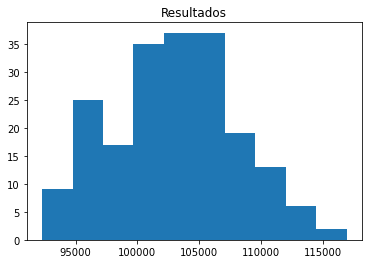

In [499]:
#1Valores estándar
pruebas_4(500,'./data/US120.txt',0.5,0.02,0.0045)

---- Tiempo 200 ejecuciones 10.70359492301941 segundos ----

Máximo: 190228.6651548715
Mínimo: 149264.72702458347
Media: 171218.53857515668
Proporción óptima: 0.5 %


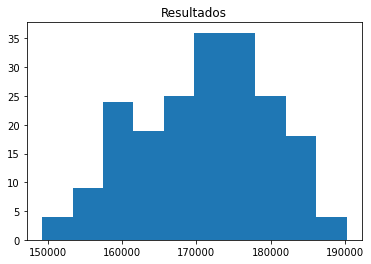

In [502]:
#2Pocas iteraciones con el enfriamiento lento y baja temperatura inicial
pruebas_4(30,'./data/US120.txt',0.1,0.01,0.00005)

---- Tiempo 200 ejecuciones 10.424742698669434 segundos ----

Máximo: 194413.13007639832
Mínimo: 149500.15112799243
Media: 170937.7611621761
Proporción óptima: 0.5 %


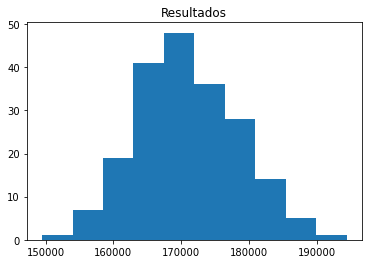

In [503]:
#3Pocas iteraciones con el enfriamiento rápido y temperatura inicial alta
pruebas_4(30,'./data/US120.txt',0.9,0.3,0.05)

---- Tiempo 200 ejecuciones 31.34389638900757 segundos ----

Máximo: 116081.41042851096
Mínimo: 89881.31110303506
Media: 103017.99208095472
Proporción óptima: 0.5 %


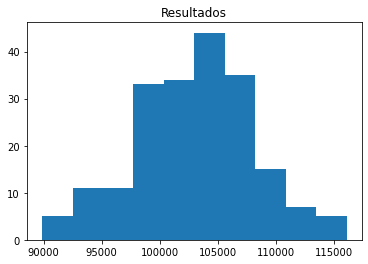

In [504]:
#4Muchas iteraciones con el enfriamiento rápido y temperatura inicial baja
pruebas_4(500,'./data/US120.txt',0.1,0.01,0.05)

---- Tiempo 200 ejecuciones 32.13481330871582 segundos ----

Máximo: 117336.78439537258
Mínimo: 87222.590226858
Media: 102451.14513879523
Proporción óptima: 0.5 %


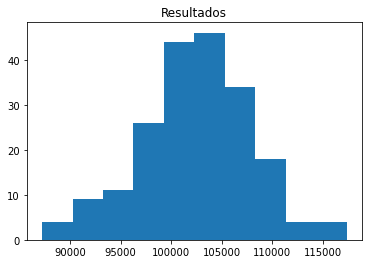

In [505]:
#5Muchas iteraciones con el enfriamiento lento y temperatura inicial alta
pruebas_4(500,'./data/US120.txt',0.9,0.3,0.00005)

---- Tiempo 200 ejecuciones 26.210129499435425 segundos ----

Máximo: 118191.97570192826
Mínimo: 89270.91746063251
Media: 102599.00195985928
Proporción óptima: 0.5 %


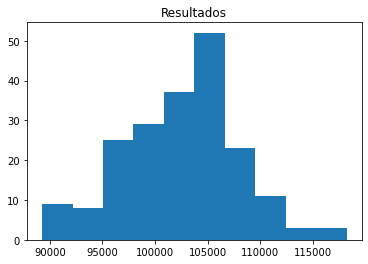

In [514]:
#6Muchas iteraciones con el enfriamiento rápido y temperatura inicial alta
pruebas_4(500,'./data/US120.txt',0.8,0.05,0.085)

 
## P1.2: Mejoras del algoritmo de Temple Simulado

En esta sección el objetivo es realizar mejoras al algoritmo desarrollado previamente, de acuerdo con lo visto en las clases expositivas. Podrá modificarse cualquiera de los siguientes parámetros u operadores:
- El valor inicial del parámetro de control (T0).
- El mecanismo de enfriamiento.
- La velocidad de enfriamiento.
- El mecanismo de selección de las soluciones candidatas
- El criterio de parada

**Importante**: Debes mantener una implementación de la versión básica que pueda ser ejecutada en la evaluación. Así que se recomienda que la implementación del algoritmo con las mejoras sea implementada en otra función. 

❓ **Pregunta 5**. Implementa un laboratorio para evaluar el impacto de las mejoras consideradas. ¿Qué intervenciones de mejora te ha llevado a mejores resultados? Explica brevemente las mejoras o intervenciones de mejora realizadas, cómo la has implementado, porqué las consideras buenas para el problema y presenta tus conclusiones acompañadas de los resultados obtenidos.

**Importante**:  Para la Pregunta 5, tu informe no debería superar las 600 palabras.


### Respuesta 5

Para este apartado se llevarán a cabo una serie de modificaciones al algoritmo de ejercicios anteriores con el objetivo de mejorar el rendimiento de este:

    -Generación se solución inicial con estrategia voraz: en esta mejora se crea una función que se basará en una estrategia voraz para generar la solución original. Dicha estrategia se basa en, partiendo de la ciudad inicial, ir añadiendo a la solución la ciudad cercana más visitada. Los resultados en este caso fueron realmente buenos, con una media de 27036 y un mínimo de 26737, junto con una distribución en el histograma en la que casi todos los valores se hayan en las dos primeras barras. Estos resultados mejoran enormemente los observados en apartados previos de esta práctica.
    
    -Uso del criterio de enfriamiento de Cauchy: en este apartado se sustituye el mecanismo de enfriamento por el de Cauchy (Tk=T0/(1+k)) con el objeto de observar su impacto en el rendimiento. En este caso el rendimiento no es del todo malo, sin embargo su media de 103301 y su mínimo de 90016 son muy similares a los observados en el apartado 4 por lo que esta modificación no constituye ninguna mejora ni empeoramiento visible.
    
    -Selección de soluciones candidatas: en este apartado se sustituye la función de selección de soluciones candidatas, previamente totalmente aleatoria, por una función que, sirviéndose de los datos de las distancias, buscará el par de ciudades de la solución más separadas entre sí, y intercambiará la primera de ellas a una posición aleatoria, excepto que la primera sea la ciudad de origen en cuyo caso se intercambia la segunda. En este caso se han realizado dos ejecuciones, una de 500 iteraciones cuyos valores son relativamente similares a los del ejercicio 4, la media incluso peor (113332), y una de 1000 en la que sí se empieza a vislumbrar cierta mejora no en la media pero sí en términos del mínimo alcanzado 76139.
    
    -Criterio de parada mediante temperatura final: en este apartado la modificiación eliminará el for que limitaba las iteraciones al valor introducido y lo substituirá por un valor de temperatura final a introducir. En cada iteración se comparará el valor de la temperatura con la temperatura final, en caso de ser menor la primera se detendrá la ejecución. En este caso se optó por una temperatura final de e^(-100). Los  resultados son relativamente buenos con una media de 72944 y un mínimo de 62788. Sin embargo la ejecución se demoró considerablemente por lo que es una peor alternativa que la primera implementada.
    
En resumen, se han logrado alcanzar ciertas mejoras para algunas de las modificaciones realizadas, siendo más significativas en la solución inicial voraz y en el cambio de criterio de parada. Sim embargo, la mejora lograda mediante la primera modificación es tan significativa que permite poner de manifiesto la importancia de la selección de la solución inicial, además de ilustrar como en ocasiones la mezcla de dos técnicas diferentes de búsqueda puede llevar a resultados realmente buenos. El proceso probablemente podría continuar mejorándose mediante la elaboración de más pruebas exhaustivas, preferiblemente con un mayor poder de cómputo para reducir la demora en las pruebas, en búsqueda de los mejores valores para los parámetros que determinan tanto la temperatura inicial como la velocidad de enfriamiento. La fusión de esos valores de los parámetros junto con la búsqueda voraz de la solución inicial podría conducir a una mejora todavía mayor.


Máximo: 29687.577044003086
Mínimo: 26737.13272993181
Media: 27036.744449229805
Proporción óptima: 0.5 %


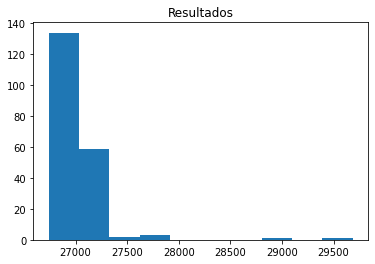

In [518]:
#Algoritmo de fuerza bruta para buscar la solución inicial seleccionando a cada rato la ciudad más cercana

def Solucion_inicial_mejora (g):

            
    solucion=[]
    solucion.append(0)#añadimos ciudad de partida

    for i in range(g.nciudades-1):
        sig=0
        coste=float('inf')
        #recorremos las ciudades
        for j in range(1,g.nciudades):
            #elegimos la de menor distancia si no ha sido elegida aún
            if(j not in solucion and g.distancia(solucion[i],j)<coste):
                sig=j
                coste=g.distancia(solucion[i],j)

        solucion.append(sig)
    solucion.append(0)#añadimos la de partida para volver
    return solucion



from mpmath import *

#Funcion temperatura inicial
def Toriginal(g,So,probab,empeorar):
    return (-empeorar)/math.log(probab)*coste(So,g);
    
#Función mecanismo de enfriamiento
def T(iter,lamb=0.0045):
    return 20*math.exp(-lamb*iter)

#Temple simulado similar al de ejercicios anteriores
def TempleSimuladoSolinicialVoraz(limite,nombrearchivo='./data/grafo8cidades.txt', probab=0.5, empeorar=0.02,lamb=0.045):
    g=Localizaciones(nombrearchivo)
    
    #Solucion inicial según función anterior
    Sact=Solucion_inicial_mejora(g)
    Smej=Sact
    
    temp=Toriginal(g,Sact,probab,empeorar)
    
    #iteraciones
    for i in range(limite):
        Scand=S_vecinos(Sact,g.nciudades)
        dcost=coste(Scand,g)-coste(Sact,g)
        if (random.uniform(0,1)<exp(-dcost/temp) or dcost<0):
            Sact=Scand
        if (dcost<0):
            Smej=Sact
        temp=T(i,lamb)
        
    return Smej

def pruebas_5_1(limite=1000,nombrearchivo='./data/grafo8cidades.txt',prob=0.5,emp=0.02,lamb=0.0045):
    
    g=Localizaciones(nombrearchivo)
    resultej5=[coste(TempleSimuladoSolinicialVoraz(limite,nombrearchivo,prob,emp,lamb),g) for i in range (200)]
    
    imprimir_resultados(resultej5)
    
pruebas_5_1(500,'./data/US120.txt')



Máximo: 119901.10309796626
Mínimo: 90016.04614127493
Media: 103301.5893520659
Proporción óptima: 0.5 %


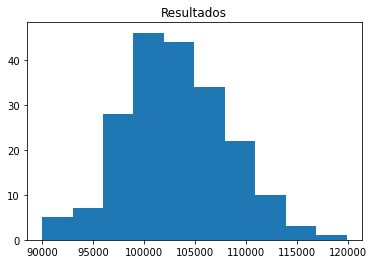

In [519]:
#Mecanismo de enfriamiento con criterio de Cauchy


from mpmath import *

#Funcion temperatura inicial
def Toriginal(g,So,probab,empeorar):
    return (-empeorar)/math.log(probab)*coste(So,g);
    
#Función mecanismo de enfriamiento con Cauchy
def TC(iter):
    return 20/(1+iter)

#Temple simulado
def TempleSimuladoCauchy(limite,nombrearchivo='./data/grafo8cidades.txt', probab=0.5, empeorar=0.02):
    g=Localizaciones(nombrearchivo)
    
    #Solucion inicial
    Sact=Solucion_inicial(g.nciudades)
    Smej=Sact
    
    temp=Toriginal(g,Sact,probab,empeorar)
    #iteraciones
    for i in range(limite):
        Scand=S_vecinos(Sact,g.nciudades)
        dcost=coste(Scand,g)-coste(Sact,g)
        if (random.uniform(0,1)<exp(-dcost/temp) or dcost<0):
            Sact=Scand
        if (dcost<0):
            Smej=Sact
        temp=TC(i)#Actualización de la temperatura con el nuevo mecanismo
        
    return Smej

def pruebas_5_1(limite=1000,nombrearchivo='./data/grafo8cidades.txt',prob=0.5,emp=0.02):
    
    g=Localizaciones(nombrearchivo)
    resultej5=[coste(TempleSimuladoCauchy(limite,nombrearchivo,prob,emp),g) for i in range (200)]
    
    imprimir_resultados(resultej5)
    
pruebas_5_1(500,'./data/US120.txt')



Máximo: 175868.57091521658
Mínimo: 87643.55332430033
Media: 113332.2034997499
Proporción óptima: 0.5 %


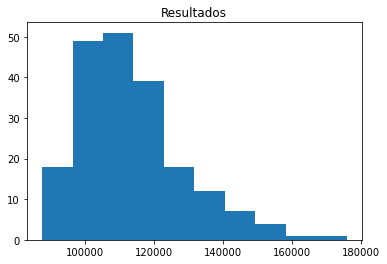


Máximo: 163646.76296258334
Mínimo: 76139.51260458004
Media: 102746.30090049785
Proporción óptima: 0.5 %


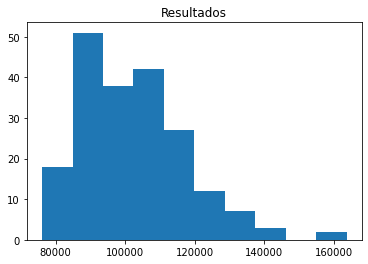

In [522]:
#Selección de soluciones candidatas buscando el par de ciudades más distanciado y intercambiando la primera de ellas
#a una posición aleatoria, salvo que la primera del par sea la ciudad de partida, en ese caso se moverá la segunda

#Generar soluciones vecinas
def S_vecinos_mejora (solucion,g):
    costemax=0
    posicion=-1
    #buscamos la posición del primero del par con más distancia
    for i in range(g.nciudades):
        if(g.distancia(solucion[i],solucion[i+1])>costemax):
            costemax=g.distancia(solucion[i],solucion[i+1])
            posicion=i
           
    solvecina=solucion.copy()
    
    if(posicion==0): #no podemos mover la ciudad inicial por lo que moveremos la siguiente a algún lugar aleatorio
        #intercambio de valores
        temp=solucion[1]
        destino=random.randint(2, g.nciudades-1)
        solvecina[1]=solvecina[destino]
        solvecina[destino]=temp
        
    else:
        temp=solucion[posicion]
        #Generamos destino hasta que no coincida con la misma posición que se quiere cambiar
        destino=random.randint(2, g.nciudades-1)
        while destino==posicion:
            destino=random.randint(1, g.nciudades-1)
        #intercambio valores    
        solvecina[posicion]=solvecina[destino]
        solvecina[destino]=temp
        
    return solvecina

from mpmath import *

#Funcion temperatura inicial
def Toriginal(g,So,probab,empeorar):
    return (-empeorar)/math.log(probab)*coste(So,g);
    
#Función mecanismo de enfriamiento
def T(iter,lamb=0.0045):
    return 20*math.exp(-lamb*iter)

#Temple simulado
def TempleSimuladoSolcandidatas(limite,nombrearchivo='./data/grafo8cidades.txt', probab=0.5, empeorar=0.02,lamb=0.045):
    g=Localizaciones(nombrearchivo)
    
    Sact=Solucion_inicial(g.nciudades)
    Smej=Sact
    
    temp=Toriginal(g,Sact,probab,empeorar)
    
    for i in range(limite):
        Scand=S_vecinos_mejora(Sact,g)
        dcost=coste(Scand,g)-coste(Sact,g)
        if (random.uniform(0,1)<exp(-dcost/temp) or dcost<0):
            Sact=Scand
        if (dcost<0):
            Smej=Sact
        temp=T(i,lamb)
        
    return Smej

def pruebas_5_1(limite=1000,nombrearchivo='./data/grafo8cidades.txt',prob=0.5,emp=0.02,lamb=0.0045):
    
    g=Localizaciones(nombrearchivo)
    resultej5=[coste(TempleSimuladoSolcandidatas(limite,nombrearchivo,prob,emp,lamb),g) for i in range (200)]
    
    imprimir_resultados(resultej5)
    
pruebas_5_1(500,'./data/US120.txt')
pruebas_5_1(1000,'./data/US120.txt')


Máximo: 82232.79432917606
Mínimo: 62788.45438644898
Media: 72944.33112498671
Proporción óptima: 0.5 %


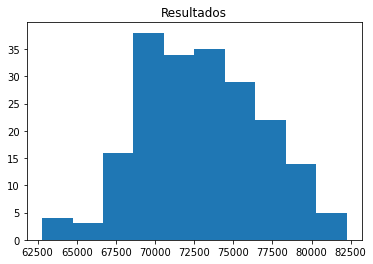

In [536]:
#Cambio condición de parada

from mpmath import *

#Funcion temperatura inicial
def Toriginal(g,So,probab,empeorar):
    return (-empeorar)/math.log(probab)*coste(So,g);
    
#Función mecanismo de enfriamiento
def T(iter,lamb=0.0045):
    return 20*math.exp(-lamb*iter)

#Temple simulado
def TempleSimuladoCondParada(Tf,nombrearchivo='./data/grafo8cidades.txt', probab=0.5, empeorar=0.02,lamb=0.045):
    g=Localizaciones(nombrearchivo)
    
    Sact=Solucion_inicial(g.nciudades)
    Smej=Sact
    
    temp=Toriginal(g,Sact,probab,empeorar)
    iter=0
    while (temp>Tf):
        Scand=S_vecinos(Sact,g.nciudades)
        dcost=coste(Scand,g)-coste(Sact,g)
        if (random.uniform(0,1)<exp(-dcost/temp) or dcost<0):
            Sact=Scand
        if (dcost<0):
            Smej=Sact
        iter+=1
        temp=T(iter,lamb)
        
    return Smej

def pruebas_5_1(limite=1000,nombrearchivo='./data/grafo8cidades.txt',prob=0.5,emp=0.02,lamb=0.0045):
    
    g=Localizaciones(nombrearchivo)
    resultej5=[coste(TempleSimuladoCondParada(exp(-100),nombrearchivo,prob,emp,lamb),g) for i in range (200)]
    
    imprimir_resultados(resultej5)
    
pruebas_5_1(500,'./data/US120.txt',0.5,0.02,0.05)